In [1]:
########################### Low & High Flow Conditions #############################
# The purpose of this script is to make a plot of surface salinity and surface
# stresses in the model domain to show low vs. high flow conditions and on- and
# offshore winds. In order to find the best time(s), a movie will be made to sort 
# through everything.
#
# Notes:
# - Run in xroms kernel 
#####################################################################################

In [38]:
# Load in the packages 
import numpy as np
import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
import matplotlib
from matplotlib import gridspec
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import transforms 
from matplotlib import cm, ticker
from joblib import Parallel, delayed
from glob import glob
import cmocean
#import matplotlib.ticker as tick
import matplotlib.patches as patches
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import matplotlib.colors as mcolors
import xesmf as xe


import cartopy
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
import matplotlib.ticker as tick
import warnings
import xroms
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogFormatterExponent
crs = ccrs.PlateCarree()
warnings.filterwarnings("ignore") #turns off annoying warnings
#Cartopy
land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                edgecolor='face',
                                facecolor=cfeature.COLORS['land'])

# The core of the analysis is done with xhistogram
#from xhistogram.xarray import histogram

In [3]:
# Set a universal fontsize
fontsize = 25

# Set the tick size for all plots
matplotlib.rc('xtick', labelsize=fontsize-13) 
matplotlib.rc('ytick', labelsize=fontsize-13)

# Prevent tick labels from overlapping
matplotlib.rcParams['xtick.major.pad'] = 12
matplotlib.rcParams['ytick.major.pad'] = 12

In [4]:
# Load in the grid
grid = xr.open_dataset('/projects/brun1463/ROMS/Kakak3_Alpine/Include/KakAKgrd_shelf_big010_smooth006.nc')
#grid = xr.open_dataset('/Users/brun1463/Desktop/Research_Lab/Kaktovik_Alaska_2019/Code/Grids/KakAKgrd_shelf_big010_smooth006.nc') # UPDATE PATH


# Pull out some dimensions
eta_rho_len = len(grid.eta_rho)
xi_rho_len = len(grid.xi_rho)
s_rho_len = int(20)
Nbed_len = 11

# Multiply by masks to make land appear 
# Make it so land will appear
temp_mask = grid.mask_rho.copy()
temp_mask = np.where(temp_mask==0, np.nan, temp_mask)

In [5]:
# Load in the rho masks 
mask_rho_nan = xr.open_dataset('/projects/brun1463/ROMS/Kakak3_Alpine/Scripts_2/Analysis/Nudge_masks/nudge_mask_rho_ones_nans.nc') # UPDATE PATH
mask_rho_zeros = xr.open_dataset('/projects/brun1463/ROMS/Kakak3_Alpine/Scripts_2/Analysis/Nudge_masks/nudge_mask_rho_zeros_ones.nc')
#mask_rho_nan = xr.open_dataset('/Users/brun1463/Desktop/Research_Lab/Kaktovik_Alaska_2019/Code/Nudge_masks/nudge_mask_rho_ones_nans.nc')
#mask_rho_zeros = xr.open_dataset('/Users/brun1463/Desktop/Research_Lab/Kaktovik_Alaska_2019/Code/Nudge_masks/nudge_mask_rho_zeros_ones.nc')

### Define a Bunch of Functions
These are all courtesy of Dylan Schlichting 

In [6]:
def open_mfroms(path):
    '''
Opens multiple netcdf files with xroms
    '''
    # chunk = {"xi": -1, "eta": -1, "ocean_time": -1} 
    # chunks = {}
    # for sub in ["rho", "u", "v", "psi"]:
        # for k, v in chunk.items():
            # chunks[f"{k}_{sub}"] = v
    # chunks["ocean_time"] = chunk["ocean_time"]

    ds = xroms.open_mfnetcdf(path)
    ds,grid = xroms.roms_dataset(ds,include_cell_volume=True)
    ds.xroms.set_grid(grid)
    return ds,grid

def add_derivatives(ds, grid, q='salt'):
    '''
Analysis of velocity gradient tensor and frontogenesis function
following Hetland et al. (2025) JPO
    '''
    qs = ds[q]
    
    #############################
    # Flow and property gradients at the ocean surface
    
    ds['dqdx'] = xroms.to_rho(grid.derivative(qs.isel(s_rho=-1), 'X'), grid)    # defined at rho-points
    ds['dqdy'] = xroms.to_rho(grid.derivative(qs.isel(s_rho=-1), 'Y'), grid)    # defined at rho-points
    
    ds['dudx'] = grid.derivative(ds.isel(s_rho=-1).u, 'X', boundary='extend')  # defined at rho-points
    ds['dvdy'] = grid.derivative(ds.isel(s_rho=-1).v, 'Y', boundary='extend')  # defined at rho-points
    ds['dvdx'] = xroms.to_rho(grid.derivative(ds.isel(s_rho=-1).v, 'X', boundary='extend'), grid)  # defined at rho-points
    ds['dudy'] = xroms.to_rho(grid.derivative(ds.isel(s_rho=-1).u, 'Y', boundary='extend'), grid)  # defined at rho-points
    
    ###########################
    # Invariant flow properties
    
    # Vorticity:  v_x - u_y
    ds['zeta'] = (ds.dvdx - ds.dudy)/ds.f
    ds['zeta'].name = 'Normalized vorticity'

    # Divergence: u_x + v_y
    ds['delta'] = (ds.dudx + ds.dvdy)/ds.f
    ds['delta'].name = 'Normalized divergence'

    # Major axis of deformation
    ds['alpha'] = ( np.sqrt( (ds.dudx-ds.dvdy)**2 + (ds.dvdx+ds.dudy)**2 ) )/ds.f
    ds['alpha'].name = 'Normalized total strain'

    ##################################
    # Principle deformation components

    ds['lminor'] = 0.5 * (ds.delta - ds.alpha)
    ds['lminor'].name = 'lambda minor'

    ds['lmajor'] = 0.5 * (ds.delta + ds.alpha)
    ds['lmajor'].name = 'lambda major'
    
    #############################################
    # Along- and cross-frontal velocity gradients
    
    # angle is wrt x, so need to do arctan2(y, x)
    ds['phi_cf'] = np.arctan2(ds.dqdy, ds.dqdx)
    ds['phi_af'] = ds.phi_cf + np.pi/2.0

    ds['du_cf'] = ( ds.dudx*np.cos(ds.phi_cf)**2 + ds.dvdy*np.sin(ds.phi_cf)**2 
               + (ds.dudy + ds.dvdx)*np.sin(ds.phi_cf)*np.cos(ds.phi_cf) )/ds.f

    ds['du_af'] = ( ds.dudx*np.cos(ds.phi_af)**2 + ds.dvdy*np.sin(ds.phi_af)**2
              + (ds.dudy + ds.dvdx)*np.sin(ds.phi_af)*np.cos(ds.phi_af) )/ds.f
    
    ############################
    # The frontogenesis function
    
    # Dimensional frontogenesis function
    Dgradq_i = - ds.dudx*ds.dqdx - ds.dvdx*ds.dqdy
    Dgradq_j = - ds.dudy*ds.dqdx - ds.dvdy*ds.dqdy
    ds['Ddelq2'] = (ds.dqdx*Dgradq_i + ds.dqdy*Dgradq_j)
    ds['Ddelq2'].name = 'Frontogenesis function'

    # Density gradients squared
    ds['gradq2'] = ds.dqdx**2 + ds.dqdy**2
    ds['gradq2'].name = r'$(\nabla q)^2$'

    # Normalized frontogenesis function
    ds['nFGF'] = 0.5 * ds.Ddelq2 / (ds.gradq2 * ds.f)
    ds['nFGF'].name = r'Normalized Frontogenesis Function'
    
    return ds

In [7]:
# Load in one model output file to make a test plot
# Paper 2 Aggregated run 

# Old school xarray
#ds = xr.open_dataset('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00001.nc')
ds = xr.open_mfdataset('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc')

# Fancy xroms way - gives error about h which is super lame 
#path = glob('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc')

#ds, grid = open_mfroms(path)
#add_derivatives(ds,grid)

In [8]:
ds

<xarray.Dataset> Size: 1TB
Dimensions:                 (ocean_time: 781, tracer: 29, boundary: 4, NST: 27,
                             s_rho: 20, s_w: 21, eta_rho: 206, xi_rho: 608,
                             eta_u: 206, xi_u: 607, eta_v: 205, xi_v: 608,
                             eta_psi: 205, xi_psi: 607, Nbed: 11)
Coordinates:
  * s_rho                   (s_rho) float64 160B -0.975 -0.925 ... -0.075 -0.025
  * s_w                     (s_w) float64 168B -1.0 -0.95 -0.9 ... -0.05 0.0
    lon_rho                 (eta_rho, xi_rho) float64 1MB dask.array<chunksize=(206, 608), meta=np.ndarray>
    lat_rho                 (eta_rho, xi_rho) float64 1MB dask.array<chunksize=(206, 608), meta=np.ndarray>
    lon_u                   (eta_u, xi_u) float64 1MB dask.array<chunksize=(206, 607), meta=np.ndarray>
    lat_u                   (eta_u, xi_u) float64 1MB dask.array<chunksize=(206, 607), meta=np.ndarray>
    lon_v                   (eta_v, xi_v) float64 997kB dask.array<chunksize=(205, 608), meta=np.ndarray>
    lat_v                   (eta_v, xi_v) float64 997kB dask.array<chunksize=(205, 608), meta=np.ndarray>
    lon_psi                 (eta_psi, xi_psi) float64 995kB dask.array<chunksize=(205, 607), meta=np.ndarray>
    lat_psi                 (eta_psi, xi_psi) float64 995kB dask.array<chunksize=(205, 607), meta=np.ndarray>
  * ocean_time              (ocean_time) datetime64[ns] 6kB 2020-07-01T01:00:...
Dimensions without coordinates: tracer, boundary, NST, eta_rho, xi_rho, eta_u,
                                xi_u, eta_v, xi_v, eta_psi, xi_psi, Nbed
Data variables: (12/220)
    ntimes                  (ocean_time) int32 3kB 2125440 2125440 ... 2125440
    ndtfast                 (ocean_time) int32 3kB 20 20 20 20 ... 20 20 20 20
    dt                      (ocean_time) float64 6kB 5.0 5.0 5.0 ... 5.0 5.0 5.0
    dtfast                  (ocean_time) float64 6kB 0.25 0.25 ... 0.25 0.25
    dstart                  (ocean_time) datetime64[ns] 6kB 2020-07-01T01:00:...
    nHIS                    (ocean_time) int32 3kB 2880 2880 2880 ... 2880 2880
    ...                      ...
    Zo_bio                  (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
    active_layer_thickness  (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
    dep_net                 (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
    Dwave                   (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
    Pwave_bot               (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
    Uwave_rms               (ocean_time, eta_rho, xi_rho) float64 783MB dask.array<chunksize=(43, 206, 608), meta=np.ndarray>
Attributes: (12/49)
    file:              /scratch/alpine/brun1463/ROMS_scratch/Beaufort_Shelf_R...
    format:            netCDF-3 64bit offset file
    Conventions:       CF-1.4, SGRID-0.3
    type:              ROMS/TOMS history file
    title:             One-dimension (vertical) Sediment Toy
    var_info:          /projects/brun1463/COAWST/Workshop/COAWST-master/ROMS/...
    ...                ...
    compiler_command:  /curc/sw/install/intel/2022.1.2/mpi/2021.5.1/bin/mpifc
    compiler_flags:    -fp-model=precise -ip -O3
    tiling:            012x004
    history:           ROMS/TOMS, Version 3.9, Wednesday - April 30, 2025 -  ...
    ana_file:          ROMS/Functionals/ana_btflux.h, ROMS/Functionals/ana_st...
    CPP_options:       BEAUFORT_RIVERS_AK_002, ANA_BPFLUX, ANA_BSFLUX, ANA_BT...

In [9]:
# Get surface salinity and pick a time to look at

# (or nah)

In [10]:
# Interpolate sustr and svstr onto rho points 

# Need to find regridding weights to go from 
# u and v points to rho points 
# Set the input and output grids, and sepcify the lat/lon
# Since we are looking at u and v, we will use lon_u and lat_u as the primary lat/lon for the grid 
# and make another with lat_v and lon_v
# U input grid 
ds_in_u = grid.copy() # need to use lon_180 for this grid 
ds_in_u['lon'] = (('eta_u', 'xi_u'), ds_in_u.lon_u.values)
ds_in_u['lat'] = (('eta_u', 'xi_u'), ds_in_u.lat_u.values)
# V input grid 
ds_in_v = grid.copy() # need to use lon_180 for this grid 
ds_in_v['lon'] = (('eta_v', 'xi_v'), ds_in_v.lon_v.values)
ds_in_v['lat'] = (('eta_v', 'xi_v'), ds_in_v.lat_v.values)

# Output grid (ROMS rho grid)
ds_out_rho = grid.copy()
ds_out_rho['lat'] = (('eta_rho', 'xi_rho'), ds_out_rho.lat_rho.values)
ds_out_rho['lon'] = (('eta_rho', 'xi_rho'), ds_out_rho.lon_rho.values)

# Add masks 
# ex: ds["mask"] = xr.where(~np.isnan(ds["zeta"].isel(ocean_time=0)), 1, 0)
# Input grid (HYCOM)
# this is only a surface mask - which is what we want 
# U
ds_in_u['mask'] = (('eta_u', 'xi_u'), ds_in_u.mask_u.values)
# V
ds_in_v['mask'] = (('eta_v', 'xi_v'), ds_in_v.mask_v.values)
# Output grid (ROMS rho grid)
ds_out_rho['mask'] = (('eta_rho', 'xi_rho'), ds_out_rho.mask_rho.values)

# Regrid from u grid to rho grid with the masks included and extrapolation used 
regridder_u2rho = xe.Regridder(ds_in_u, ds_out_rho, method="bilinear", extrap_method='inverse_dist') #extrap_method="nearest_s2d"
regridder_u2rho
# Regrid from v grid to rho grid with the masks included and extrapolation used 
regridder_v2rho = xe.Regridder(ds_in_v, ds_out_rho, method="bilinear", extrap_method='inverse_dist') #extrap_method="nearest_s2d"
regridder_v2rho

xESMF Regridder 
Regridding algorithm:       bilinear 
Weight filename:            bilinear_205x608_206x608.nc 
Reuse pre-computed weights? False 
Input grid shape:           (205, 608) 
Output grid shape:          (206, 608) 
Periodic in longitude?      False

In [11]:
# Regrid sustr and svstr
sustr_rho = regridder_u2rho(ds.sustr)
svstr_rho = regridder_v2rho(ds.svstr)

In [12]:
# Eventually will need to cut out trimmed region but can show full domain for now

### Plots
Make some test plots before committing to a full movie! 

In [13]:
river_marker_colors = ['#FC440F', '#F5ED00', '#5EF38C', '#26532B', '#F43ECF', '#9C00A8',
                       '#0115F5', '#00A6A6', '#AB64EB', '#D44179', '#08E0E3', '#B27009', '#EA8D40']

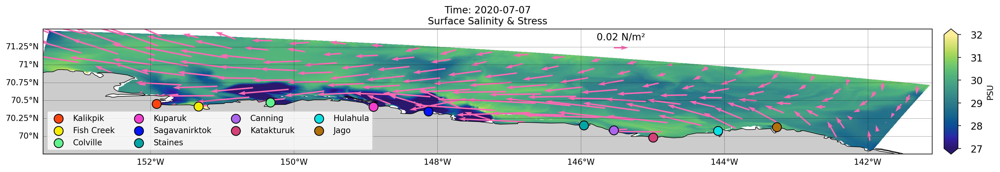

In [14]:
# Make a test plot
# Plot surface salinity and surface stress as quivers

# Set the time to plot
t = 40

# Set the quiver slice
nslice = 25

# Make the figure
fig, ax = plt.subplots(figsize=(16,6), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# --- Surface Salinity ---
# Plot the surface salinity
m1 = ds.salt[t,-1,:,:].plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = 27, vmax=32
)

# Plot the colorbar 
cbar_ax1 = fig.add_axes([1.01,0.32,0.015,0.36])
fig.colorbar(m1,ax=ax,extend='both',
             label=r'PSU',
             pad=0.005, cax=cbar_ax1)

# Set extent and map features
ax.set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

# Plot the gridlines and stuff?
gl1 = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl1.right_labels = gl1.top_labels = False
gl1.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl1.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Time: ' +str(ds.ocean_time.values[t])[:10] + '\nSurface Salinity & Stress') #Only display yyyy-mm-dd

# Add Quiver plots for the surface stresses 
q1 = ax.quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
               sustr_rho[t,::nslice,::nslice], svstr_rho[t,::nslice,::nslice],
               color='hotpink', angles='xy', scale_units='xy', units='xy',
               width=0.02)
ax.quiverkey(q1, 0.65, 0.85, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':12})

# Add in the rivers
# Plot the 14 rivers in the grid
# Go from West to East
# Kalikpik River
eta_kal_idx = 23 #22
xi_kal_idx = 87
s1 = ax.scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
            transform=ccrs.PlateCarree(), zorder=500)

# Fish Creek
eta_fis_idx = 20
xi_fis_idx = 117 #116
s2 = ax.scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
            transform=ccrs.PlateCarree(), zorder=500)

# Colville River
eta_col_idx = 39
xi_col_idx = 166 #166
s3 = ax.scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
            transform=ccrs.PlateCarree(), zorder=500)

# Sakonowyak River
eta_sak_idx = 46 #45
xi_sak_idx = 234
#s4 = ax11.scatter(x_rho_flat[xi_sak_idx]/1000, y_rho_flat[eta_sak_idx]/1000, 
 #           marker='.', s=500, linewidth=1, edgecolors='black', color='green', label='Sakonowyak')

# Kuparik
# Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
# of the Kuparuk River
eta_kuk_idx = 41 #40
xi_kuk_idx = 239
eta_kup_idx = 41 #40
xi_kup_idx = 242
s5 = ax.scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
            transform=ccrs.PlateCarree(), zorder=500)

# Kuparuk - commented out to move dot onto old Kukpuk since that is the main 
# channel of the Kuparuk 
#s6 = ax7[3].scatter(x_rho_flat_trimmed[xi_kup_idx]/1000, y_rho_flat[eta_kup_idx]/1000, 
 #           marker='.', s=500, linewidth=1, edgecolors='black', color='pink', label='Kuparuk')


# Fawn Creek
#eta_faw_idx = 44 #43
#xi_faw_idx = 249
#s7 = ax3[1].scatter(x_rho_flat[xi_faw_idx]/1000, y_rho_flat[eta_faw_idx]/1000, 
 #           marker='.', s=500, linewidth=1, edgecolors='black', color='darkviolet', label='Fawn Creek')

# Putuligayuk River
eta_put_idx = 28 #27
xi_put_idx = 264
#s8 = ax11.scatter(x_rho_flat[xi_put_idx]/1000, y_rho_flat[eta_put_idx]/1000, 
 #           marker='1', s=500, linewidth=1, edgecolors='black', color='dodgerblue', label='Putuligayuk')

# Sagavanirktok River
eta_sag_idx = 37 #36
xi_sag_idx = 279
s9 = ax.scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
            transform=ccrs.PlateCarree(), zorder=500)

# Canning River
# Staines River
eta_sta_idx = 27 #26
xi_sta_idx = 393
s10 = ax.scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
            transform=ccrs.PlateCarree(), zorder=500)

# Canning River
eta_can_idx = 20 #19
xi_can_idx = 416
s11 = ax.scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
            transform=ccrs.PlateCarree(), zorder=500)

# Katakturuk River
eta_kat_idx = 9 #8
xi_kat_idx = 447
s12 = ax.scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
            transform=ccrs.PlateCarree(), zorder=500)

# Hulahula River
eta_hul_idx = 40
xi_hul_idx = 489
s13 = ax.scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
            transform=ccrs.PlateCarree(), zorder=500)

# Jago River
eta_jag_idx = 62 #61
xi_jag_idx = 528
s14 = ax.scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
            marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
            transform=ccrs.PlateCarree(), zorder=500)

# Siksik River
eta_sik_idx = 46
xi_sik_idx = 574 #573
#s15 = ax11.scatter(x_rho_flat[xi_sik_idx]/1000, y_rho_flat[eta_sik_idx]/1000, 
 #           marker='.', s=300, linewidth=4, color='deeppink', label='Siksik')

# Make a legend
ax.legend(ncol=4, loc='lower left')

# Plot the plot?
fig.canvas.draw()


In [15]:
# Get the file names for all so that we can loop through all outputs 
# and make the plot, then combine them all into one movie for the 
# full run

# Use glob to get file names/paths

# Loop through and call parallel plotting function? 

# Jk just do open_mfdataset

### Movies!
Make some mooooovie plotssss

In [16]:
# Movie for the one with numerical mixing of salinity and temperature
# Copy the thing above butttt adding in temperature and salinity 

def plot_frame(t):

    # This can be changed depending on how often you want to save frames. Useful if you want 
    # to coarsen the output frequency
    i = t // 1  # This assumes `t` is incrementing by 1 (e.g., range(0, len(rv.Time), 1))
    
    # Set the quiver slice
    nslice = 25

    # Make the figure
    fig, ax = plt.subplots(figsize=(16,6), dpi=200,
                        constrained_layout=True, 
                        subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
    # Set the overall title/time
    #fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

    # --- Surface Salinity ---
    # Plot the surface salinity
    m1 = ds.salt[t,-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax,
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 27, vmax=32
    )

    # Plot the colorbar 
    cbar_ax1 = fig.add_axes([1.01,0.32,0.015,0.36])
    fig.colorbar(m1,ax=ax,extend='both',
                label=r'PSU',
                pad=0.005, cax=cbar_ax1)

    # Set extent and map features
    ax.set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                facecolor='0.8'), linewidth=.7)
    ax.coastlines(resolution='10m', linewidth=.7)

    # Plot the gridlines and stuff?
    gl1 = ax.gridlines(crs=ccrs.PlateCarree(), 
                    draw_labels=True, 
                    x_inline=False, y_inline=False, 
                    linewidth=0.33, color='k',alpha=0.5)
    gl1.right_labels = gl1.top_labels = False
    gl1.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
    gl1.xlabel_style = {'rotation': 0, 'ha': 'center'}

    ax.set_title('Time: ' +str(ds.ocean_time.values[t])[:10] + '\nSurface Salinity & Stress') #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q1 = ax.quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[t,::nslice,::nslice], svstr_rho[t,::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.02)
    ax.quiverkey(q1, 0.65, 0.85, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':12})

    # Add in the rivers
    # Plot the 14 rivers in the grid
    # Go from West to East
    # Kalikpik River
    eta_kal_idx = 23 #22
    xi_kal_idx = 87
    s1 = ax.scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                transform=ccrs.PlateCarree(), zorder=500)

    # Fish Creek
    eta_fis_idx = 20
    xi_fis_idx = 117 #116
    s2 = ax.scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                transform=ccrs.PlateCarree(), zorder=500)

    # Colville River
    eta_col_idx = 39
    xi_col_idx = 166 #166
    s3 = ax.scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                transform=ccrs.PlateCarree(), zorder=500)

    # Sakonowyak River
    eta_sak_idx = 46 #45
    xi_sak_idx = 234
    #s4 = ax11.scatter(x_rho_flat[xi_sak_idx]/1000, y_rho_flat[eta_sak_idx]/1000, 
    #           marker='.', s=500, linewidth=1, edgecolors='black', color='green', label='Sakonowyak')

    # Kuparik
    # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
    # of the Kuparuk River
    eta_kuk_idx = 41 #40
    xi_kuk_idx = 239
    eta_kup_idx = 41 #40
    xi_kup_idx = 242
    s5 = ax.scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Kuparuk - commented out to move dot onto old Kukpuk since that is the main 
    # channel of the Kuparuk 
    #s6 = ax7[3].scatter(x_rho_flat_trimmed[xi_kup_idx]/1000, y_rho_flat[eta_kup_idx]/1000, 
    #           marker='.', s=500, linewidth=1, edgecolors='black', color='pink', label='Kuparuk')


    # Fawn Creek
    #eta_faw_idx = 44 #43
    #xi_faw_idx = 249
    #s7 = ax3[1].scatter(x_rho_flat[xi_faw_idx]/1000, y_rho_flat[eta_faw_idx]/1000, 
    #           marker='.', s=500, linewidth=1, edgecolors='black', color='darkviolet', label='Fawn Creek')

    # Putuligayuk River
    eta_put_idx = 28 #27
    xi_put_idx = 264
    #s8 = ax11.scatter(x_rho_flat[xi_put_idx]/1000, y_rho_flat[eta_put_idx]/1000, 
    #           marker='1', s=500, linewidth=1, edgecolors='black', color='dodgerblue', label='Putuligayuk')

    # Sagavanirktok River
    eta_sag_idx = 37 #36
    xi_sag_idx = 279
    s9 = ax.scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    # Staines River
    eta_sta_idx = 27 #26
    xi_sta_idx = 393
    s10 = ax.scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    eta_can_idx = 20 #19
    xi_can_idx = 416
    s11 = ax.scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                transform=ccrs.PlateCarree(), zorder=500)

    # Katakturuk River
    eta_kat_idx = 9 #8
    xi_kat_idx = 447
    s12 = ax.scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Hulahula River
    eta_hul_idx = 40
    xi_hul_idx = 489
    s13 = ax.scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                transform=ccrs.PlateCarree(), zorder=500)

    # Jago River
    eta_jag_idx = 62 #61
    xi_jag_idx = 528
    s14 = ax.scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                transform=ccrs.PlateCarree(), zorder=500)

    # Siksik River
    eta_sik_idx = 46
    xi_sik_idx = 574 #573
    #s15 = ax11.scatter(x_rho_flat[xi_sik_idx]/1000, y_rho_flat[eta_sik_idx]/1000, 
    #           marker='.', s=300, linewidth=4, color='deeppink', label='Siksik')

    # Make a legend
    ax.legend(ncol=4, loc='lower left')

    # Plot the plot?
    fig.canvas.draw()
    
    
    # Comment this out if you are printing a lot of frames... jupyter will be unhappy
    #print(f'/pscratch/sd/b/bundzis/Beaufort_ROMS_2020_nosed_dvd_myroms_scratch/Movies/Rel_vort_surf_salt_temp_mnum/surf_zetaf_salt_temp_mnum_{i}.png')
   
    plt.savefig(
        f'/scratch/alpine/brun1463/ROMS_scratch/Beaufort_Shelf_Rivers_Alpine_002_scratch/Movies/Surf_salt_stress/Attempt002/surf_salt_stress_agg_dbsed0001_{i}.png',
        dpi=200, bbox_inches='tight'
    )
    plt.close(fig)  # Close to avoid memory leaks


In [17]:
# Call this function in parallel to make the plots for the movie 
# Run 8 plots in parallel at once (adjust n_jobs based on your CPU).
# Uncomment below to run to make the movie/plots for the movie 
#Parallel(n_jobs=4)(delayed(plot_frame)(t) for t in range(0, len(ds.ocean_time), 1))

### Plots
Make a plot with subplots for different flow conditions 

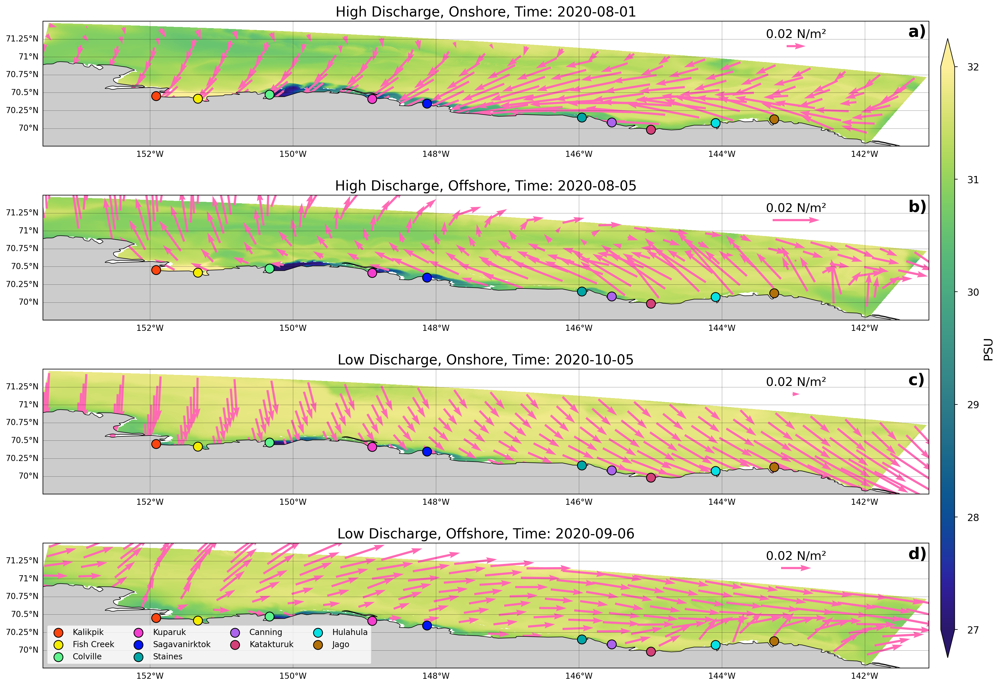

In [16]:
# Make a better version of the plot above with a loop 

# Set the time to plot
t1 = 190 # August 1 = high discharge, onshore 
t2 = 210 # August 5 = high discharge, offshore
t3 = 580 # October 5 = low discharge, onshore
t4 = 406 # September 6 = low discharge, offshore
# *not true yet, needs to be checked 

# Set a list of the times 
flow_times = [t1, t2, t3, t4] # replace with indices when we have them 

# Make a list of strings of flow conditions for titles 
flow_conditions = ['High Discharge, Onshore', 'High Discharge, Offshore', 'Low Discharge, Onshore', 'Low Discharge, Offshore']

# Set the quiver slice
nslice = 25

# Make the figure
# Make the figure
fig1, ax1 = plt.subplots(4, figsize=(16,12), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m2 = ds.salt[flow_times[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    # Set extent and map features
    ax1[n].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
    ax1[n].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                facecolor='0.8'), linewidth=.7)
    ax1[n].coastlines(resolution='10m', linewidth=.7)

    # Plot the gridlines and stuff?
    gl2 = ax1[n].gridlines(crs=ccrs.PlateCarree(), 
                    draw_labels=True, 
                    x_inline=False, y_inline=False, 
                    linewidth=0.33, color='k',alpha=0.5)
    gl2.right_labels = gl2.top_labels = False
    gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
    gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

    ax1[n].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_times[n]])[:10], fontsize=fontsize-8) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_times[n],::nslice,::nslice], svstr_rho[flow_times[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n].quiverkey(q2, 0.85, 0.80, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':fontsize-10}) # (0.65, 0.85)

    # Add in the rivers
    # Plot the 10 rivers in the grid
    # Go from West to East
    # Kalikpik River
    s1 = ax1[n].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                transform=ccrs.PlateCarree(), zorder=500)

    # Fish Creek
    s2 = ax1[n].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                transform=ccrs.PlateCarree(), zorder=500)

    # Colville River
    s3 = ax1[n].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                transform=ccrs.PlateCarree(), zorder=500)

    # Kuparik
    # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
    # of the Kuparuk River
    s5 = ax1[n].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Sagavanirktok River
    s9 = ax1[n].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    # Staines River
    s10 = ax1[n].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    s11 = ax1[n].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                transform=ccrs.PlateCarree(), zorder=500)

    # Katakturuk River
    s12 = ax1[n].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Hulahula River
    s13 = ax1[n].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                transform=ccrs.PlateCarree(), zorder=500)

    # Jago River
    s14 = ax1[n].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                transform=ccrs.PlateCarree(), zorder=500)

    # # If one of the first three subplots, mute the x-axis 
    # if n != (len(flow_times)-1):
    #     print('n: ', n)
    #     plt.setp(ax1[n].get_xticklabels(), visible=False)


# It's ignoring this...
plt.setp(ax1[0].get_xticklabels(), visible=False)
plt.setp(ax1[1].get_xticklabels(), visible=False)
plt.setp(ax1[2].get_xticklabels(), visible=False)

# Add subplot labels 
fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar 
cbar_ax1 = fig1.add_axes([1.01,0.05,0.015,0.89])
fig1.colorbar(m1, ax=(ax1[0],ax1[1], ax1[2], ax1[3]),extend='both',
             pad=0.005, cax=cbar_ax1).set_label(label=r'PSU', size=fontsize-10)

# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# Make a legend
ax1[3].legend(ncol=4, loc='lower left', fontsize=fontsize-15)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.04, wspace=0.35) #0.08 # (0.22, 0.25)

# Plot the plot?
fig.canvas.draw()


In [17]:
ds.ocean_time[580].values

np.datetime64('2020-10-05T17:00:00.000000000')

In [18]:
# Find the new time period
ds.ocean_time[355].values

np.datetime64('2020-08-29T05:00:00.000000000')

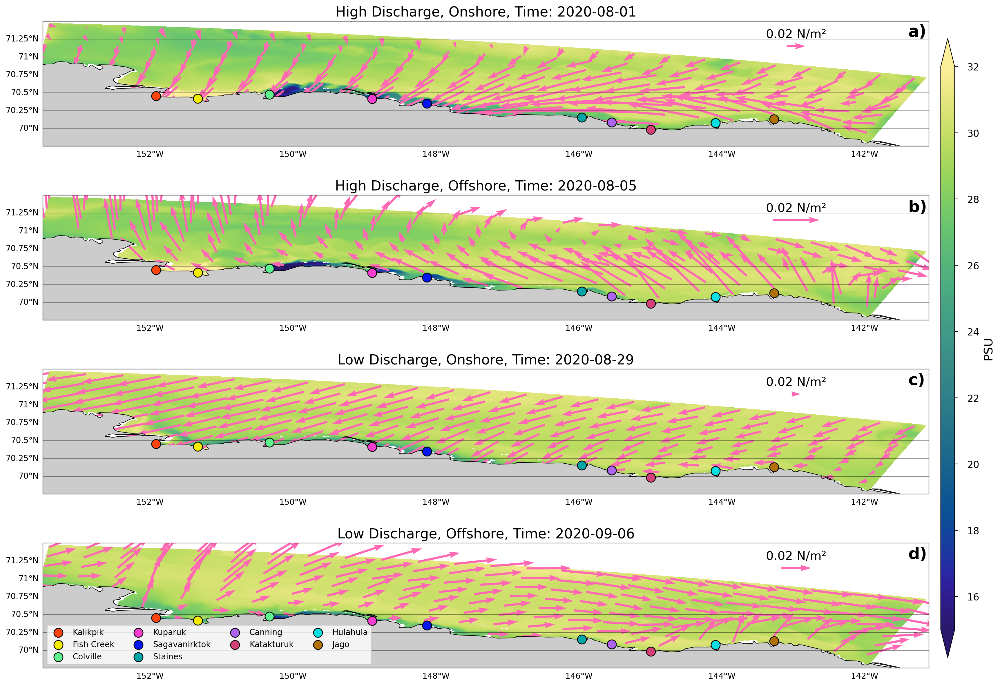

In [21]:
# Make another plot that is the same as above but 
# with a different time period for low flow onshore
# that has lower river discharge

# Set the time to plot
t1b = 190 # August 1 = high discharge, onshore 
t2b = 210 # August 5 = high discharge, offshore
t3b = 355 # August 29 = low discharge, onshore
t4b = 406 # September 6 = low discharge, offshore
# *not true yet, needs to be checked 

# Set a list of the times 
flow_timesb = [t1b, t2b, t3b, t4b] # replace with indices when we have them 

# Make a list of strings of flow conditions for titles 
flow_conditions = ['High Discharge, Onshore', 'High Discharge, Offshore', 'Low Discharge, Onshore', 'Low Discharge, Offshore']

# Set the quiver slice
nslice = 25

# Make the figure
# Make the figure
fig1, ax1 = plt.subplots(4, figsize=(16,12), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m2 = ds.salt[flow_timesb[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    # Set extent and map features
    ax1[n].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
    ax1[n].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                facecolor='0.8'), linewidth=.7)
    ax1[n].coastlines(resolution='10m', linewidth=.7)

    # Plot the gridlines and stuff?
    gl2 = ax1[n].gridlines(crs=ccrs.PlateCarree(), 
                    draw_labels=True, 
                    x_inline=False, y_inline=False, 
                    linewidth=0.33, color='k',alpha=0.5)
    gl2.right_labels = gl2.top_labels = False
    gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
    gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

    ax1[n].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=fontsize-8) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n].quiverkey(q2, 0.85, 0.80, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':fontsize-10}) # (0.65, 0.85)

    # Add in the rivers
    # Plot the 10 rivers in the grid
    # Go from West to East
    # Kalikpik River
    s1 = ax1[n].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                transform=ccrs.PlateCarree(), zorder=500)

    # Fish Creek
    s2 = ax1[n].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                transform=ccrs.PlateCarree(), zorder=500)

    # Colville River
    s3 = ax1[n].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                transform=ccrs.PlateCarree(), zorder=500)

    # Kuparik
    # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
    # of the Kuparuk River
    s5 = ax1[n].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Sagavanirktok River
    s9 = ax1[n].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    # Staines River
    s10 = ax1[n].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    s11 = ax1[n].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                transform=ccrs.PlateCarree(), zorder=500)

    # Katakturuk River
    s12 = ax1[n].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Hulahula River
    s13 = ax1[n].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                transform=ccrs.PlateCarree(), zorder=500)

    # Jago River
    s14 = ax1[n].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                transform=ccrs.PlateCarree(), zorder=500)

    # # If one of the first three subplots, mute the x-axis 
    # if n != (len(flow_times)-1):
    #     print('n: ', n)
    #     plt.setp(ax1[n].get_xticklabels(), visible=False)


# It's ignoring this...
plt.setp(ax1[0].get_xticklabels(), visible=False)
plt.setp(ax1[1].get_xticklabels(), visible=False)
plt.setp(ax1[2].get_xticklabels(), visible=False)

# Add subplot labels 
fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar 
cbar_ax1 = fig1.add_axes([1.01,0.05,0.015,0.89])
fig1.colorbar(m2, ax=(ax1[0],ax1[1], ax1[2], ax1[3]),extend='both',
             pad=0.005, cax=cbar_ax1).set_label(label=r'PSU', size=fontsize-10)

# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# Make a legend
ax1[3].legend(ncol=4, loc='lower left', fontsize=fontsize-15)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.04, wspace=0.35) #0.08 # (0.22, 0.25)

# Plot the plot?
fig.canvas.draw()

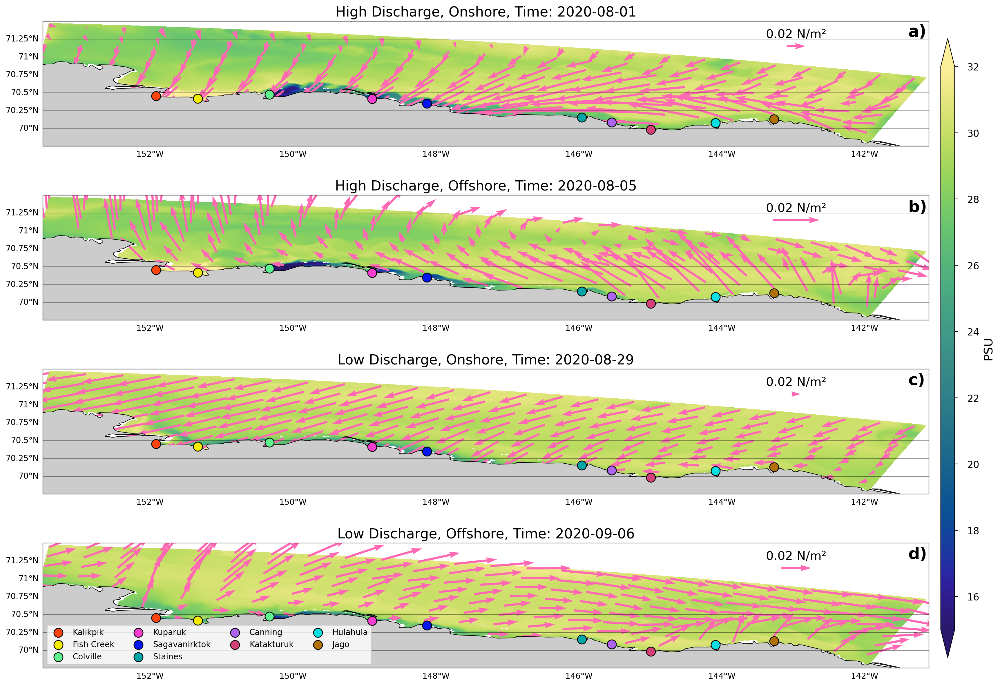

In [22]:
# Same as above but different colorbar range

# Make the figure
fig1, ax1 = plt.subplots(4, figsize=(16,12), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m3 = ds.salt[flow_timesb[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    # Set extent and map features
    ax1[n].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
    ax1[n].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                facecolor='0.8'), linewidth=.7)
    ax1[n].coastlines(resolution='10m', linewidth=.7)

    # Plot the gridlines and stuff?
    gl2 = ax1[n].gridlines(crs=ccrs.PlateCarree(), 
                    draw_labels=True, 
                    x_inline=False, y_inline=False, 
                    linewidth=0.33, color='k',alpha=0.5)
    gl2.right_labels = gl2.top_labels = False
    gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
    gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

    ax1[n].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=fontsize-8) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n].quiverkey(q2, 0.85, 0.80, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':fontsize-10}) # (0.65, 0.85)

    # Add in the rivers
    # Plot the 10 rivers in the grid
    # Go from West to East
    # Kalikpik River
    s1 = ax1[n].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                transform=ccrs.PlateCarree(), zorder=500)

    # Fish Creek
    s2 = ax1[n].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                transform=ccrs.PlateCarree(), zorder=500)

    # Colville River
    s3 = ax1[n].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                transform=ccrs.PlateCarree(), zorder=500)

    # Kuparik
    # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
    # of the Kuparuk River
    s5 = ax1[n].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Sagavanirktok River
    s9 = ax1[n].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    # Staines River
    s10 = ax1[n].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                transform=ccrs.PlateCarree(), zorder=500)

    # Canning River
    s11 = ax1[n].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                transform=ccrs.PlateCarree(), zorder=500)

    # Katakturuk River
    s12 = ax1[n].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                transform=ccrs.PlateCarree(), zorder=500)

    # Hulahula River
    s13 = ax1[n].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                transform=ccrs.PlateCarree(), zorder=500)

    # Jago River
    s14 = ax1[n].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                transform=ccrs.PlateCarree(), zorder=500)

    # # If one of the first three subplots, mute the x-axis 
    # if n != (len(flow_times)-1):
    #     print('n: ', n)
    #     plt.setp(ax1[n].get_xticklabels(), visible=False)


# It's ignoring this...
plt.setp(ax1[0].get_xticklabels(), visible=False)
plt.setp(ax1[1].get_xticklabels(), visible=False)
plt.setp(ax1[2].get_xticklabels(), visible=False)

# Add subplot labels 
fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar 
cbar_ax1 = fig1.add_axes([1.01,0.05,0.015,0.89])
fig1.colorbar(m3, ax=(ax1[0],ax1[1], ax1[2], ax1[3]),extend='both',
             pad=0.005, cax=cbar_ax1).set_label(label=r'PSU', size=fontsize-10)

# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# Make a legend
ax1[3].legend(ncol=4, loc='lower left', fontsize=fontsize-15)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.04, wspace=0.35) #0.08 # (0.22, 0.25)

# Plot the plot?
fig.canvas.draw()

In [23]:
# Make a function to open a given model output,
# calculate the depth-integrated riverine SSC at a given
# time in all space, then return that spatial array

def get_depth_int_riverine_ssc_onetime(filename, time):
    """
    The purpose of this function is to take a given model output, open it,
    calculate the depth-integrated riverine suspended sediment concentration
    at a certain time in the output, then return the spatial array with that 
    data.

    Inputs:
    - filename: Path to the desired model output (string, ex: '/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc')
    - time: The time index that the data is wanted for 

    Outputs:
    - depth_int_riv_ssc_t1: Depth-integrated total riverine SSC at a given time (dimensions [eta_rho, xi_rho])
    """

    # Open the dataset
    model_output  = xr.open_mfdataset(filename)

    # Calculate the total riverine SSC for all depths/space at a given time
    tot_riv_ssc_t1 = (model_output.mud_15[time,:,:,:] + model_output.mud_16[time,:,:,:] + model_output.mud_17[time,:,:,:] + model_output.mud_18[time,:,:,:] + model_output.mud_19[time,:,:,:] +
                      model_output.mud_20[time,:,:,:] + model_output.mud_21[time,:,:,:] + model_output.mud_22[time,:,:,:] + model_output.mud_23[time,:,:,:] + model_output.mud_24[time,:,:,:])

    #print('tot_riv_ssc_t1 shape: ', np.shape(tot_riv_ssc_t1), flush=True)

    # Now get the vertical thicknesses 
    # To collapse to horizontal, multiply each layer by its thickness
    # Calculate the time-varying thickness of the cells
    dz = abs(model_output.z_w[time,:-1,:,:].values - model_output.z_w[time,1:,:,:].values)
    
    # Multiply the SSC by thick thickness
    depth_int_riv_ssc_t1_tmp = (tot_riv_ssc_t1*dz)

    #print('depth_int_riv_ssc_t1_tmp shape: ', np.shape(depth_int_riv_ssc_t1_tmp), flush=True)
    
    # Then depth-integrated by summing over depth and dividing by dy
    depth_int_riv_ssc_t1 = (depth_int_riv_ssc_t1_tmp.sum(dim='s_rho'))

    #print('depth_int_riv_ssc_t1 shape: ', np.shape(depth_int_riv_ssc_t1), flush=True)

    # Return this array
    return(depth_int_riv_ssc_t1)




In [24]:
# Make a copy of the plot above that has a 
# second column with the depth-integrated 
# riverine SSC at those times, too

# Get the depth-integrated riverine SSC at a given time
# Make a function to get this

# Call the function for these times
# Aggregated mud runs
agg_river_ssc_t1b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc', t1b)
agg_river_ssc_t2b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc', t2b)
agg_river_ssc_t3b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc', t3b)
agg_river_ssc_t4b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Aggregated/dbsed0001_10rivs/ocean_his_beaufort_rivers_10rivs_13seabed_aggregated_dbsed0001_00*.nc', t4b)

# Unaggregated mud runs
unag_river_ssc_t1b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Unaggregated/dbsed0001_10rivs_unaggregated/ocean_his_beaufort_rivers_10rivs_13seabed_unaggregated_dbsed0001_00*.nc', t1b)
unag_river_ssc_t2b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Unaggregated/dbsed0001_10rivs_unaggregated/ocean_his_beaufort_rivers_10rivs_13seabed_unaggregated_dbsed0001_00*.nc', t2b)
unag_river_ssc_t3b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Unaggregated/dbsed0001_10rivs_unaggregated/ocean_his_beaufort_rivers_10rivs_13seabed_unaggregated_dbsed0001_00*.nc', t3b)
unag_river_ssc_t4b = get_depth_int_riverine_ssc_onetime('/pl/active/moriarty_lab/BriannaU/Paper2/Model_Output/Unaggregated/dbsed0001_10rivs_unaggregated/ocean_his_beaufort_rivers_10rivs_13seabed_unaggregated_dbsed0001_00*.nc', t4b)

# Sum up the values for aggregated and unaggregated 
tot_river_ssc_t1b = agg_river_ssc_t1b + unag_river_ssc_t1b
tot_river_ssc_t2b = agg_river_ssc_t2b + unag_river_ssc_t2b
tot_river_ssc_t3b = agg_river_ssc_t3b + unag_river_ssc_t3b
tot_river_ssc_t4b = agg_river_ssc_t4b + unag_river_ssc_t4b

# Plot this all...

In [25]:
np.shape(tot_river_ssc_t1b)

(206, 608)

In [26]:
np.max(tot_river_ssc_t1b.values)

np.float64(0.18153041279923637)

In [27]:
print('max riverine SSC during low flow,onshore: ', np.max(tot_river_ssc_t3b.values))

max riverine SSC during low flow,onshore:  0.30226313370460406


In [28]:
print('mean riverine SSC during low flow,onshore: ', np.mean(tot_river_ssc_t3b.values))

mean riverine SSC during low flow,onshore:  0.00028576635847607105


In [29]:
print('std dev riverine SSC during low flow,onshore: ', np.std(tot_river_ssc_t3b.values))

std dev riverine SSC during low flow,onshore:  0.0024883091456048157


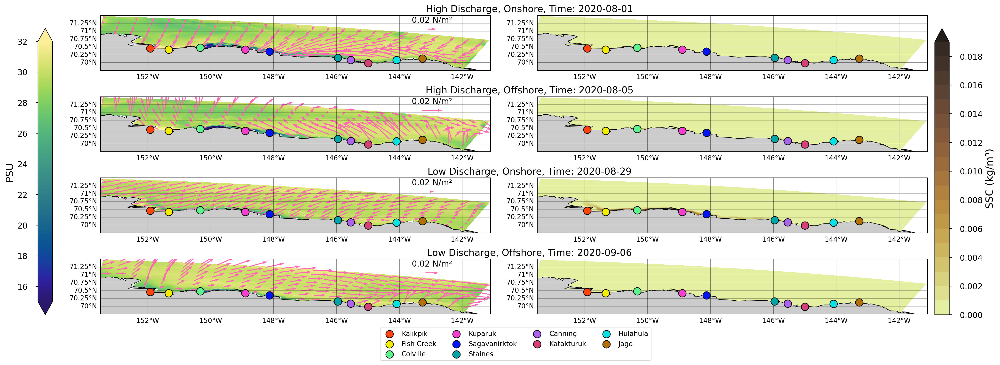

In [30]:
# Now plot these values and see how they look
# NEXT TIME PLAY WITH PLOT WIDTH FIRST

# Set min, max and levels for SSC plots
vmin_ssc = 0.0
vmax_ssc = 0.02
lev_ssc = np.arange(vmin_ssc, vmax_ssc, 0.001)

# Make the figure
fig1, ax1 = plt.subplots(4, 2, figsize=(20,8), dpi=200, #figsize=(16,12) (18,6) (16,6) is good ratio but too small 
                       #constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Manually plot the SSC
m5 = ax1[0,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t1b,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m6 = ax1[1,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t2b,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m7 = ax1[2,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t3b,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m8 = ax1[3,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t4b,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m4 = ds.salt[flow_timesb[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n,0],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    ax1[n,0].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n,0].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n,0].quiverkey(q2, 0.85, 0.75, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':12}) # (0.65, 0.85) (0.85, 0.80)

    # Add in the rivers to all subplots
    # Loop through the columns
    for o in range(2):

        # Set extent and map features
        ax1[n,o].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
        ax1[n,o].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                    facecolor='0.8'), linewidth=.7)
        ax1[n,o].coastlines(resolution='10m', linewidth=.7)

        # Plot the gridlines and stuff?
        gl2 = ax1[n,o].gridlines(crs=ccrs.PlateCarree(), 
                        draw_labels=True, 
                        x_inline=False, y_inline=False, 
                        linewidth=0.33, color='k',alpha=0.5)
        gl2.right_labels = gl2.top_labels = False
        gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
        gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

        #print('o: ', o)
        # Plot the 10 rivers in the grid
        # Go from West to East
        # Kalikpik River
        s1 = ax1[n,o].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Fish Creek
        s2 = ax1[n,o].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Colville River
        s3 = ax1[n,o].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Kuparik
        # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
        # of the Kuparuk River
        s5 = ax1[n,o].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Sagavanirktok River
        s9 = ax1[n,o].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        # Staines River
        s10 = ax1[n,o].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        s11 = ax1[n,o].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Katakturuk River
        s12 = ax1[n,o].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Hulahula River
        s13 = ax1[n,o].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Jago River
        s14 = ax1[n,o].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                    transform=ccrs.PlateCarree(), zorder=500)

    # If one of the first three subplots, mute the x-axis 
    if n != (len(flow_times)-1):
        #print('n: ', n)
        plt.setp(ax1[n,0].get_xticklabels(), visible=False)
        plt.setp(ax1[n,1].get_xticklabels(), visible=False)


# It's ignoring this...
# plt.setp(ax1[0,0].get_xticklabels(), visible=False)
# plt.setp(ax1[1,0].get_xticklabels(), visible=False)
# plt.setp(ax1[2,0].get_xticklabels(), visible=False)

# plt.setp(ax1[0,1].get_xticklabels(), visible=False)
# plt.setp(ax1[1,1].get_xticklabels(), visible=False)
# plt.setp(ax1[2,1].get_xticklabels(), visible=False)
# plt.setp(ax1[0,1].get_yticklabels(), visible=False)
# plt.setp(ax1[1,1].get_yticklabels(), visible=False)
# plt.setp(ax1[2,1].get_yticklabels(), visible=False)

ax1[0,0].tick_params(labelbottom=False)

# Make a legend
plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))

# Add subplot labels 
# fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar - salinity 
cbar_ax1 = fig1.add_axes([0.025,0.15,0.015,0.74]) # [0.02,0.13,0.02,0.74]
fig1.colorbar(m4, ax=(ax1[:,0]), extend='both',
             pad=0.005, cax=cbar_ax1, ticklocation='left').set_label(label=r'PSU', size=fontsize-10)

# Plot the colorbar - ssc
cbar_ax1b = fig1.add_axes([0.95,0.15,0.015,0.74]) # [0.95,0.13,0.02,0.74]
fig1.colorbar(m7, ax=(ax1[:,1]), extend='max',
             pad=0.005, cax=cbar_ax1b).set_label(label='SSC (kg/m\u00b3)', size=fontsize-10)


# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# # Make a legend
# plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))
# Add the colorbar
#cbar3_ax = fig3.add_axes([0.14, -0.02, 0.74, 0.05]) #[0.14, 0.000007, 0.74, 0.05]
#cbar3 = plt.colorbar(m2, cax=cbar3_ax, orientation='horizontal', extend='both').set_label(label='Suspended Sediment Mass (kg)', size=fontsize)

# Set layout
plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.12, hspace=0.45) #0.08 # (0.22, 0.25)

# Plot the plot?
fig.canvas.draw()

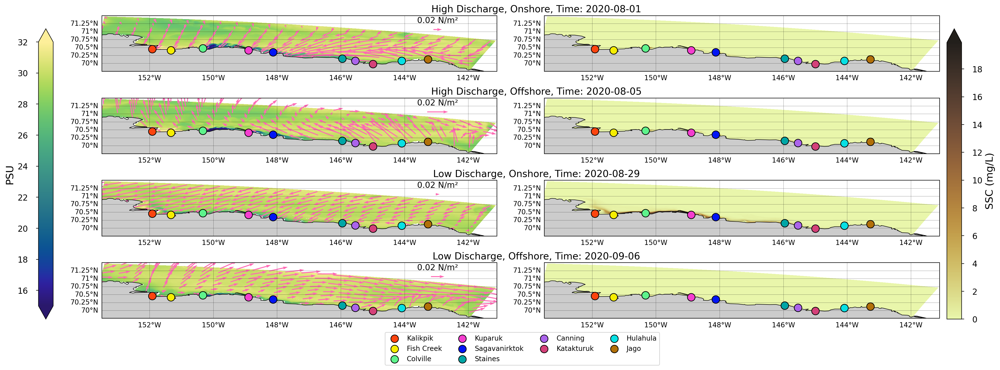

In [31]:
# Make the same plot but in mg/L

# Set min, max and levels for SSC plots
vmin_ssc = 0.0 # 0.0 kg/m3
vmax_ssc = 20 # 0.02 kg/m3
lev_ssc = np.arange(vmin_ssc, vmax_ssc, 0.1) # 0.001

# Make the figure
fig1, ax1 = plt.subplots(4, 2, figsize=(20,8), dpi=200, #figsize=(16,12) (18,6) (16,6) is good ratio but too small 
                       #constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Manually plot the SSC
m5 = ax1[0,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t1b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m6 = ax1[1,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t2b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m7 = ax1[2,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t3b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m8 = ax1[3,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t4b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m4 = ds.salt[flow_timesb[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n,0],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    ax1[n,0].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n,0].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n,0].quiverkey(q2, 0.85, 0.75, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':12}) # (0.65, 0.85) (0.85, 0.80)

    # Add in the rivers to all subplots
    # Loop through the columns
    for o in range(2):

        # Set extent and map features
        ax1[n,o].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
        ax1[n,o].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                    facecolor='0.8'), linewidth=.7)
        ax1[n,o].coastlines(resolution='10m', linewidth=.7)

        # Plot the gridlines and stuff?
        gl2 = ax1[n,o].gridlines(crs=ccrs.PlateCarree(), 
                        draw_labels=True, 
                        x_inline=False, y_inline=False, 
                        linewidth=0.33, color='k',alpha=0.5)
        gl2.right_labels = gl2.top_labels = False
        gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
        gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

        #print('o: ', o)
        # Plot the 10 rivers in the grid
        # Go from West to East
        # Kalikpik River
        s1 = ax1[n,o].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Fish Creek
        s2 = ax1[n,o].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Colville River
        s3 = ax1[n,o].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Kuparik
        # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
        # of the Kuparuk River
        s5 = ax1[n,o].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Sagavanirktok River
        s9 = ax1[n,o].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        # Staines River
        s10 = ax1[n,o].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        s11 = ax1[n,o].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Katakturuk River
        s12 = ax1[n,o].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Hulahula River
        s13 = ax1[n,o].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Jago River
        s14 = ax1[n,o].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                    transform=ccrs.PlateCarree(), zorder=500)

    # If one of the first three subplots, mute the x-axis 
    if n != (len(flow_times)-1):
        #print('n: ', n)
        plt.setp(ax1[n,0].get_xticklabels(), visible=False)
        plt.setp(ax1[n,1].get_xticklabels(), visible=False)


# It's ignoring this...
# plt.setp(ax1[0,0].get_xticklabels(), visible=False)
# plt.setp(ax1[1,0].get_xticklabels(), visible=False)
# plt.setp(ax1[2,0].get_xticklabels(), visible=False)

# plt.setp(ax1[0,1].get_xticklabels(), visible=False)
# plt.setp(ax1[1,1].get_xticklabels(), visible=False)
# plt.setp(ax1[2,1].get_xticklabels(), visible=False)
# plt.setp(ax1[0,1].get_yticklabels(), visible=False)
# plt.setp(ax1[1,1].get_yticklabels(), visible=False)
# plt.setp(ax1[2,1].get_yticklabels(), visible=False)

ax1[0,0].tick_params(labelbottom=False)

# Make a legend
plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))

# Add subplot labels 
# fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar - salinity 
cbar_ax1 = fig1.add_axes([0.025,0.15,0.015,0.74]) # [0.02,0.13,0.02,0.74]
fig1.colorbar(m4, ax=(ax1[:,0]), extend='both',
             pad=0.005, cax=cbar_ax1, ticklocation='left').set_label(label=r'PSU', size=fontsize-10)

# Plot the colorbar - ssc
cbar_ax1b = fig1.add_axes([0.95,0.15,0.015,0.74]) # [0.95,0.13,0.02,0.74]
fig1.colorbar(m7, ax=(ax1[:,1]), extend='max',
             pad=0.005, cax=cbar_ax1b).set_label(label='SSC (mg/L)', size=fontsize-10)


# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# # Make a legend
# plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))
# Add the colorbar
#cbar3_ax = fig3.add_axes([0.14, -0.02, 0.74, 0.05]) #[0.14, 0.000007, 0.74, 0.05]
#cbar3 = plt.colorbar(m2, cax=cbar3_ax, orientation='horizontal', extend='both').set_label(label='Suspended Sediment Mass (kg)', size=fontsize)

# Set layout
plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.12, hspace=0.45) #0.08 # (0.22, 0.25)

# Plot the plot?
fig.canvas.draw()

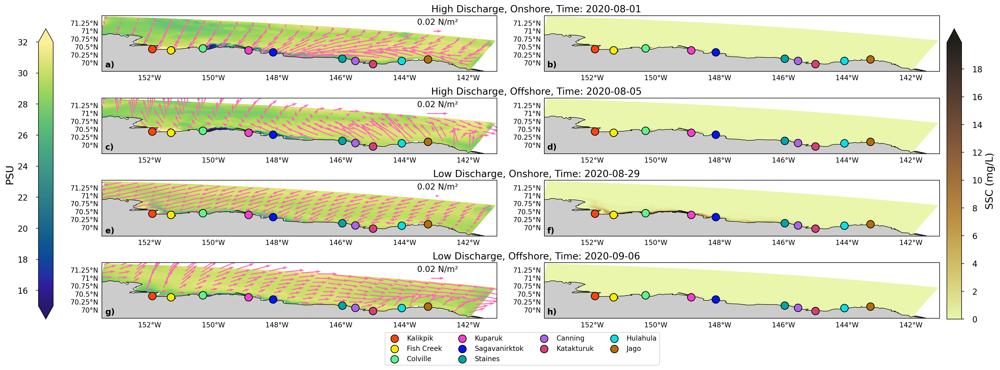

In [32]:
# Set min, max and levels for SSC plots
vmin_ssc = 0.0 # 0.0 kg/m3
vmax_ssc = 20 # 0.02 kg/m3
lev_ssc = np.arange(vmin_ssc, vmax_ssc, 0.1) # 0.001

# Make the figure
fig1, ax1 = plt.subplots(4, 2, figsize=(20,8), dpi=200, #figsize=(16,12) (18,6) (16,6) is good ratio but too small 
                       #constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Manually plot the SSC
m5 = ax1[0,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t1b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m6 = ax1[1,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t2b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m7 = ax1[2,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t3b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m8 = ax1[3,1].contourf(ds.lon_rho.values, ds.lat_rho.values, tot_river_ssc_t4b*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    m4 = ds.salt[flow_timesb[n],-1,:,:].plot(
        x='lon_rho', y='lat_rho',
        ax=ax1[n,0],
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        add_colorbar=False, facecolor="gray",
        vmin = 15, vmax=32 # (27, 35)
    )

    ax1[n,0].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99) #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    q2 = ax1[n,0].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
                sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n,0].quiverkey(q2, 0.85, 0.72, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':12}) # (0.65, 0.85) (0.85, 0.80)

    # Add in the rivers to all subplots
    # Loop through the columns
    for o in range(2):

        # Set extent and map features
        ax1[n,o].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree())
        ax1[n,o].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                    facecolor='0.8'), linewidth=.7)
        ax1[n,o].coastlines(resolution='10m', linewidth=.7)

        # Plot the gridlines and stuff?
        gl2 = ax1[n,o].gridlines(crs=ccrs.PlateCarree(), 
                        draw_labels=True, 
                        x_inline=False, y_inline=False, 
                        linewidth=0.33, color='#00000000',alpha=0)
        gl2.right_labels = gl2.top_labels = False
        gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
        gl2.xlabel_style = {'rotation': 0, 'ha': 'center'}

        #print('o: ', o)
        # Plot the 10 rivers in the grid
        # Go from West to East
        # Kalikpik River
        s1 = ax1[n,o].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Fish Creek
        s2 = ax1[n,o].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Colville River
        s3 = ax1[n,o].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Kuparik
        # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
        # of the Kuparuk River
        s5 = ax1[n,o].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Sagavanirktok River
        s9 = ax1[n,o].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        # Staines River
        s10 = ax1[n,o].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        s11 = ax1[n,o].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Katakturuk River
        s12 = ax1[n,o].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Hulahula River
        s13 = ax1[n,o].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Jago River
        s14 = ax1[n,o].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                    marker='.', s=500, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                    transform=ccrs.PlateCarree(), zorder=500)

    # If one of the first three subplots, mute the x-axis 
    if n != (len(flow_times)-1):
        #print('n: ', n)
        plt.setp(ax1[n,0].get_xticklabels(), visible=False)
        plt.setp(ax1[n,1].get_xticklabels(), visible=False)


# It's ignoring this...
# plt.setp(ax1[0,0].get_xticklabels(), visible=False)
# plt.setp(ax1[1,0].get_xticklabels(), visible=False)
# plt.setp(ax1[2,0].get_xticklabels(), visible=False)

# plt.setp(ax1[0,1].get_xticklabels(), visible=False)
# plt.setp(ax1[1,1].get_xticklabels(), visible=False)
# plt.setp(ax1[2,1].get_xticklabels(), visible=False)
# plt.setp(ax1[0,1].get_yticklabels(), visible=False)
# plt.setp(ax1[1,1].get_yticklabels(), visible=False)
# plt.setp(ax1[2,1].get_yticklabels(), visible=False)

ax1[0,0].tick_params(labelbottom=False)

# Make a legend
plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))

# Add subplot labels 
# fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar - salinity 
cbar_ax1 = fig1.add_axes([0.025,0.15,0.015,0.74]) # [0.02,0.13,0.02,0.74]
fig1.colorbar(m4, ax=(ax1[:,0]), extend='both',
             pad=0.005, cax=cbar_ax1, ticklocation='left').set_label(label=r'PSU', size=fontsize-10)

# Plot the colorbar - ssc
cbar_ax1b = fig1.add_axes([0.95,0.15,0.015,0.74]) # [0.95,0.13,0.02,0.74]
fig1.colorbar(m7, ax=(ax1[:,1]), extend='max',
             pad=0.005, cax=cbar_ax1b).set_label(label='SSC (mg/L)', size=fontsize-10)


# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# # Make a legend
# plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))
# Add the colorbar
#cbar3_ax = fig3.add_axes([0.14, -0.02, 0.74, 0.05]) #[0.14, 0.000007, 0.74, 0.05]
#cbar3 = plt.colorbar(m2, cax=cbar3_ax, orientation='horizontal', extend='both').set_label(label='Suspended Sediment Mass (kg)', size=fontsize)

# Set layout
plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.12, hspace=0.45) #0.08 # (0.22, 0.25)

# Add subplot labels
fig1.text(0.093, 0.792, 'a)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.543, 0.792, 'b)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.093, 0.582, 'c)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.543, 0.582, 'd)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.093, 0.369, 'e)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.543, 0.369, 'f)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.093, 0.162, 'g)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.543, 0.162, 'h)', color='black', fontsize=fontsize-13, weight='bold')


# Plot the plot?
fig.canvas.draw()

In [33]:
# Make the same plot as above but only with the regions we trust 

# Trim and mask things

# Set the number of cells in the sponge on each open boundary
c_west = 36
c_north = 45
c_east = 36

# Make it so land will appear
temp_mask = grid.mask_rho.copy()
temp_mask = np.where(temp_mask==0, np.nan, temp_mask)

# Prep the data by  ultiplying by the mask and trimming
# Multiply by mask and trim 
h_masked = grid.h.values*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
h_masked_trimmed = h_masked[:,c_west:-c_west]
# Time 1
tot_river_ssc_t1b_masked = tot_river_ssc_t1b*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
tot_river_ssc_t1b_masked_trimmed = tot_river_ssc_t1b_masked[:,c_west:-c_west]
# Time 2
tot_river_ssc_t2b_masked = tot_river_ssc_t2b*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
tot_river_ssc_t2b_masked_trimmed = tot_river_ssc_t2b_masked[:,c_west:-c_west]
# Time 3
tot_river_ssc_t3b_masked = tot_river_ssc_t3b*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
tot_river_ssc_t3b_masked_trimmed = tot_river_ssc_t3b_masked[:,c_west:-c_west]
# Time 4
tot_river_ssc_t4b_masked = tot_river_ssc_t4b*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
tot_river_ssc_t4b_masked_trimmed = tot_river_ssc_t4b_masked[:,c_west:-c_west]

lon_rho_trimmed = grid.lon_rho[:,c_west:-c_west].values
lat_rho_trimmed = grid.lat_rho[:,c_west:-c_west].values

# Since fluxes will be a quiver plot, slice the data 
lon_rho_trimmed_slice = lon_rho_trimmed[::nslice,::nslice]
lat_rho_trimmed_slice = lat_rho_trimmed[::nslice,::nslice]

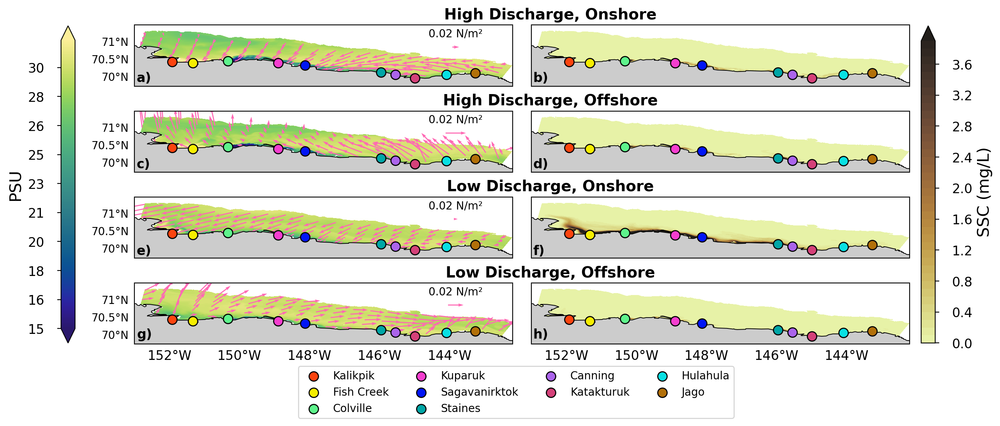

In [34]:
# Plot this trimmmed version 

# Set min, max and levels for SSC plots
vmin_ssc = 0.0 # 0.0 kg/m3
vmax_ssc = 4 # 0.02 kg/m3
lev_ssc = np.arange(vmin_ssc, vmax_ssc, 0.1) # 0.001
# Set min, max and levels for salt plots
vmin_salt = 15 # 0.0 kg/m3
vmax_salt = 32 # 0.02 kg/m3
lev_salt = np.arange(vmin_salt, vmax_salt, 0.1) # 0.001

# Make the figure
fig1, ax1 = plt.subplots(4, 2, figsize=(12,6), dpi=200, #figsize=(16,12) (18,6) (16,6) is good ratio but too small; (20, 8) (16, 8) is good
                       #constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Manually plot the SSC
m5 = ax1[0,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t1b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m6 = ax1[1,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t2b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m7 = ax1[2,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t3b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m8 = ax1[3,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t4b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    # m4 = ds.salt[flow_timesb[n],-1,:,:].plot(
    #     x='lon_rho', y='lat_rho',
    #     ax=ax1[n,0],
    #     cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
    #     add_colorbar=False, facecolor="gray",
    #     vmin = 15, vmax=32 # (27, 35)
    # )
    # Mask and trim
    # surface stresses
    salt_masked = ds.salt[flow_timesb[n],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
    salt_masked_trimmed = salt_masked[:,c_west:-c_west]

    m4 = ax1[n,0].contourf(lon_rho_trimmed, lat_rho_trimmed, salt_masked_trimmed,
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        facecolor="gray", vmin = vmin_salt, vmax=vmax_salt, levels=lev_salt, extend='both') # (27, 35)

    #ax1[n,0].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99, weight='bold') #Only display yyyy-mm-dd
    ax1[n,0].set_title(flow_conditions[n], fontsize=14, x=1.1, y=0.99, weight='bold') # + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99, weight='bold') #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 
    # Mask, trim, and slice first
    # surface stresses
    sustr_rho_masked = sustr_rho[flow_timesb[n],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
    sustr_rho_masked_trimmed = sustr_rho_masked[:,c_west:-c_west]
    svstr_rho_masked = svstr_rho[flow_timesb[n],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
    svstr_rho_masked_trimmed = svstr_rho_masked[:,c_west:-c_west]

    # Slice
    sustr_rho_masked_trimmed_slice = sustr_rho_masked_trimmed[::nslice,::nslice]
    svstr_rho_masked_trimmed_slice = svstr_rho_masked_trimmed[::nslice,::nslice]

    # q2 = ax1[n,0].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
    #             sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
    #             color='hotpink', angles='xy', scale_units='xy', units='xy',
    #             width=0.03)
    q2 = ax1[n,0].quiver(lon_rho_trimmed_slice, lat_rho_trimmed_slice, 
                sustr_rho_masked_trimmed_slice, svstr_rho_masked_trimmed_slice,
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n,0].quiverkey(q2, 0.85, 0.64, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':10}) # (0.65, 0.85) (0.85, 0.80) (0.85, 0.72)

    # Add in the rivers to all subplots
    # Loop through the columns
    for o in range(2):

        # Set extent and map features
        #ax1[n,o].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree()) # whole domain
        ax1[n,o].set_extent([-153,-142.2,69.75, 71.5],ccrs.PlateCarree()) # trimmed 
        ax1[n,o].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                    facecolor='0.8'), linewidth=.7)
        ax1[n,o].coastlines(resolution='10m', linewidth=.7)

        # Plot the gridlines and stuff?
        gl2 = ax1[n,o].gridlines(crs=ccrs.PlateCarree(), 
                        draw_labels=True, 
                        x_inline=False, y_inline=False, 
                        linewidth=0.33, color='#00000000',alpha=0)
        gl2.right_labels = gl2.top_labels = False
        gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
        gl2.xlabel_style = {'rotation': 0, 'ha': 'center', 'fontsize':fontsize-13}

        if (0 <= n < 3):
            gl2.bottom_labels=False
        if (o == 1):
            gl2.left_labels=False

        #print('o: ', o)
        # Plot the 10 rivers in the grid
        # Go from West to East
        # Kalikpik River
        s1 = ax1[n,o].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Fish Creek
        s2 = ax1[n,o].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Colville River
        s3 = ax1[n,o].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Kuparik
        # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
        # of the Kuparuk River
        s5 = ax1[n,o].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Sagavanirktok River
        s9 = ax1[n,o].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        # Staines River
        s10 = ax1[n,o].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        s11 = ax1[n,o].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Katakturuk River
        s12 = ax1[n,o].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Hulahula River
        s13 = ax1[n,o].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Jago River
        s14 = ax1[n,o].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                    transform=ccrs.PlateCarree(), zorder=500)

    # If one of the first three subplots, mute the x-axis 
    if n != (len(flow_times)-1):
        #print('n: ', n)
        plt.setp(ax1[n,0].get_xticklabels(), visible=False)
        plt.setp(ax1[n,1].get_xticklabels(), visible=False)


# It's ignoring this...
# plt.setp(ax1[0,0].get_xticklabels(), visible=False)
# plt.setp(ax1[1,0].get_xticklabels(), visible=False)
# plt.setp(ax1[2,0].get_xticklabels(), visible=False)

# plt.setp(ax1[0,1].get_xticklabels(), visible=False)
# plt.setp(ax1[1,1].get_xticklabels(), visible=False)
# plt.setp(ax1[2,1].get_xticklabels(), visible=False)
# plt.setp(ax1[0,1].get_yticklabels(), visible=False)
# plt.setp(ax1[1,1].get_yticklabels(), visible=False)
# plt.setp(ax1[2,1].get_yticklabels(), visible=False)

ax1[0,0].tick_params(labelbottom=False)

# Make a legend
plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.55, -1.3))

# Add subplot labels 
# fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar - salinity 
cbar_ax1 = fig1.add_axes([0.030,0.21,0.015,0.68]) # [0.02,0.13,0.02,0.74]; [0.025,0.15,0.015,0.74]
fig1.colorbar(m4, ax=(ax1[:,0]), extend='both',
             pad=0.005, cax=cbar_ax1, ticklocation='left', format=ticker.FormatStrFormatter('%d')).set_label(label=r'PSU', size=fontsize-10)

# Plot the colorbar - ssc
cbar_ax1b = fig1.add_axes([0.95,0.21,0.015,0.68]) # [0.95,0.13,0.02,0.74]
fig1.colorbar(m7, ax=(ax1[:,1]), extend='max',
             pad=0.005, cax=cbar_ax1b).set_label(label='SSC (mg/L)', size=fontsize-10)


# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# # Make a legend
# plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))
# Add the colorbar
#cbar3_ax = fig3.add_axes([0.14, -0.02, 0.74, 0.05]) #[0.14, 0.000007, 0.74, 0.05]
#cbar3 = plt.colorbar(m2, cax=cbar3_ax, orientation='horizontal', extend='both').set_label(label='Suspended Sediment Mass (kg)', size=fontsize)

# Set layout
plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05) #0.08 # (0.22, 0.25) (w=0.12, h=0.45) (0.12, 0.35)

# Add subplot labels
fig1.text(0.111, 0.770, 'a)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.770, 'b)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.111, 0.585, 'c)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.585, 'd)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.111, 0.399, 'e)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.399, 'f)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.111, 0.220, 'g)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.220, 'h)', color='black', fontsize=fontsize-13, weight='bold')


# Plot the plot?
fig.canvas.draw()


In [43]:
# Compute things so it will plot fast
# River SSC at the given times
tot_river_ssc_t1b_masked_trimmed = tot_river_ssc_t1b_masked_trimmed.compute()
tot_river_ssc_t2b_masked_trimmed = tot_river_ssc_t2b_masked_trimmed.compute()
tot_river_ssc_t3b_masked_trimmed = tot_river_ssc_t3b_masked_trimmed.compute()
tot_river_ssc_t4b_masked_trimmed = tot_river_ssc_t4b_masked_trimmed.compute()

# Surface stress at the given times
sustr_rho_masked = sustr_rho[flow_timesb[n],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan.compute()
sustr_rho_masked_trimmed = sustr_rho_masked[:,c_west:-c_west]
svstr_rho_masked = svstr_rho[flow_timesb[n],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan.compute()
svstr_rho_masked_trimmed = svstr_rho_masked[:,c_west:-c_west]

# Slice this stress
sustr_rho_masked_trimmed_slice = sustr_rho_masked_trimmed[::nslice,::nslice]
svstr_rho_masked_trimmed_slice = svstr_rho_masked_trimmed[::nslice,::nslice]

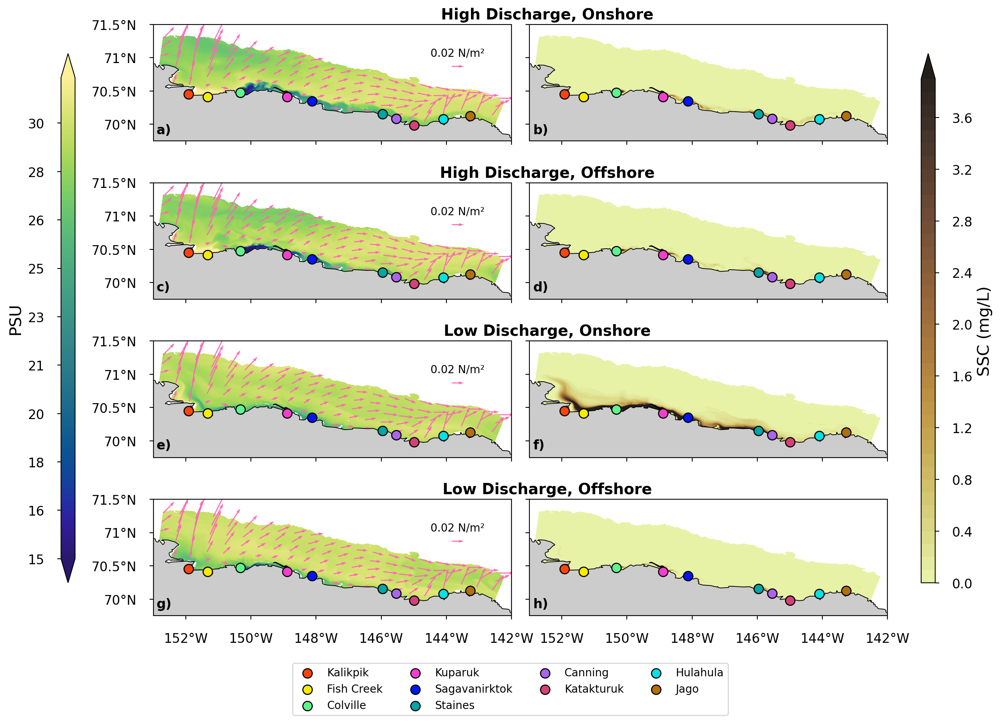

In [60]:
# Make same plot as above but with updated aspect ratio
# Set min, max and levels for SSC plots
vmin_ssc = 0.0 # 0.0 kg/m3
vmax_ssc = 4 # 0.02 kg/m3
lev_ssc = np.arange(vmin_ssc, vmax_ssc, 0.1) # 0.001
# Set min, max and levels for salt plots
vmin_salt = 15 # 0.0 kg/m3
vmax_salt = 32 # 0.02 kg/m3
lev_salt = np.arange(vmin_salt, vmax_salt, 0.1) # 0.001

# Make the figure
fig1, ax1 = plt.subplots(4, 2, figsize=(12,10), dpi=200, #figsize=(16,12) (18,6) (16,6) is good ratio but too small; (20, 8) (16, 8) is good
                       #constrained_layout=True, 
                       subplot_kw={'projection': crs}) # figsize=(12,4.5). (16,6)
# Set the overall title/time
#fig1.suptitle('Time: ' + str(ds.ocean_time.values[t])[:10], x=0.5, y=1.02)

# Manually plot the SSC
m5 = ax1[0,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t1b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m6 = ax1[1,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t2b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m7 = ax1[2,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t3b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

m8 = ax1[3,1].contourf(lon_rho_trimmed, lat_rho_trimmed, tot_river_ssc_t4b_masked_trimmed*1000,
        cmap=cmocean.cm.turbid, transform=ccrs.PlateCarree(),
        facecolor="gray", extend='max',
        vmin = vmin_ssc, vmax=vmax_ssc, levels=lev_ssc # (27, 35)
    )

# Loop through each row and plot
for n in range(len(flow_times)):
    # Plot the data
    # ----- Surface Salinity & Stress ----
    # Plot the surface salinity
    # m4 = ds.salt[flow_timesb[n],-1,:,:].plot(
    #     x='lon_rho', y='lat_rho',
    #     ax=ax1[n,0],
    #     cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
    #     add_colorbar=False, facecolor="gray",
    #     vmin = 15, vmax=32 # (27, 35)
    # )
    # Mask and trim
    # surface stresses
    salt_masked = ds.salt[flow_timesb[n],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
    salt_masked_trimmed = salt_masked[:,c_west:-c_west]

    m4 = ax1[n,0].contourf(lon_rho_trimmed, lat_rho_trimmed, salt_masked_trimmed,
        cmap=cmocean.cm.haline, transform=ccrs.PlateCarree(),
        facecolor="gray", vmin = vmin_salt, vmax=vmax_salt, levels=lev_salt, extend='both') # (27, 35)

    #ax1[n,0].set_title(flow_conditions[n] + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99, weight='bold') #Only display yyyy-mm-dd
    ax1[n,0].set_title(flow_conditions[n], fontsize=14, x=1.1, y=0.99, weight='bold') # + ', ' + 'Time: ' + str(ds.ocean_time.values[flow_timesb[n]])[:10], fontsize=14, x=1.1, y=0.99, weight='bold') #Only display yyyy-mm-dd

    # Add Quiver plots for the surface stresses 

    # q2 = ax1[n,0].quiver(ds.lon_rho[::nslice,::nslice], ds.lat_rho[::nslice,::nslice], 
    #             sustr_rho[flow_timesb[n],::nslice,::nslice], svstr_rho[flow_timesb[n],::nslice,::nslice],
    #             color='hotpink', angles='xy', scale_units='xy', units='xy',
    #             width=0.03)
    q2 = ax1[n,0].quiver(lon_rho_trimmed_slice, lat_rho_trimmed_slice, 
                sustr_rho_masked_trimmed_slice, svstr_rho_masked_trimmed_slice,
                color='hotpink', angles='xy', scale_units='xy', units='xy',
                width=0.03)
    ax1[n,0].quiverkey(q2, 0.85, 0.64, U=0.02, label='0.02 N/m\u00b2', fontproperties={'size':10}) # (0.65, 0.85) (0.85, 0.80) (0.85, 0.72)

    # Add in the rivers to all subplots
    # Loop through the columns
    for o in range(2):

        # Set extent and map features
        #ax1[n,o].set_extent([-153.5,-141.1,69.75, 71.5],ccrs.PlateCarree()) # whole domain
        ax1[n,o].set_extent([-153,-142.2,69.75, 71.5],ccrs.PlateCarree()) # trimmed 
        ax1[n,o].add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                                    facecolor='0.8'), linewidth=.7)
        ax1[n,o].coastlines(resolution='10m', linewidth=.7)

        # Set tick locations
        xticks = [-152, -150, -148, -146, -144, -142]
        yticks = [70, 70.5, 71, 71.5]

        ax1[n,o].set_yticks(yticks, crs=ccrs.PlateCarree())
        ax1[n,o].yaxis.set_major_formatter(cticker.LatitudeFormatter())
        ax1[n,o].set_xticks(xticks, crs=ccrs.PlateCarree())
        ax1[n,o].xaxis.set_major_formatter(cticker.LongitudeFormatter())

        # ---- Remove labels for first two panels ----
        if o in [0, 1] and n!= 3:
            ax1[n,o].tick_params(labelbottom=False)
        if o in [1]:
            ax1[n,o].tick_params(labelleft=False)

        # Fix the aspect ratio
        lon_min, lon_max = -153, -142.2
        lat_min, lat_max = 69.75, 71.5
        mid_lat = (lat_min + lat_max) / 2
        aspect = (lon_max - lon_min) * np.cos(np.deg2rad(mid_lat)) / (lat_max - lat_min)
        ax1[n,o].set_aspect(aspect)

        # # Plot the gridlines and stuff?
        # gl2 = ax1[n,o].gridlines(crs=ccrs.PlateCarree(), 
        #                 draw_labels=True, 
        #                 x_inline=False, y_inline=False, 
        #                 linewidth=0.33, color='#00000000',alpha=0)
        # gl2.right_labels = gl2.top_labels = False
        # gl2.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
        # gl2.xlabel_style = {'rotation': 0, 'ha': 'center', 'fontsize':fontsize-13}

        # if (0 <= n < 3):
        #     gl2.bottom_labels=False
        # if (o == 1):
        #     gl2.left_labels=False

        #print('o: ', o)
        # Plot the 10 rivers in the grid
        # Go from West to East
        # Kalikpik River
        s1 = ax1[n,o].scatter(ds.lon_rho[eta_kal_idx, xi_kal_idx].values, ds.lat_rho[eta_kal_idx, xi_kal_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[0], label='Kalikpik',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Fish Creek
        s2 = ax1[n,o].scatter(ds.lon_rho[eta_fis_idx, xi_fis_idx].values, ds.lat_rho[eta_fis_idx, xi_fis_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[1], label='Fish Creek',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Colville River
        s3 = ax1[n,o].scatter(ds.lon_rho[eta_col_idx, xi_col_idx].values, ds.lat_rho[eta_col_idx, xi_col_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[2], label='Colville',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Kuparik
        # Kukpuk - Change this to be labeled as the Kuparuk since it  is actually the main channel 
        # of the Kuparuk River
        s5 = ax1[n,o].scatter(ds.lon_rho[eta_kuk_idx, xi_kuk_idx].values, ds.lat_rho[eta_kuk_idx, xi_kuk_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[4], label='Kuparuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Sagavanirktok River
        s9 = ax1[n,o].scatter(ds.lon_rho[eta_sag_idx, xi_sag_idx].values, ds.lat_rho[eta_sag_idx, xi_sag_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[6], label='Sagavanirktok',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        # Staines River
        s10 = ax1[n,o].scatter(ds.lon_rho[eta_sta_idx, xi_sta_idx].values, ds.lat_rho[eta_sta_idx, xi_sta_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[7], label='Staines',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Canning River
        s11 = ax1[n,o].scatter(ds.lon_rho[eta_can_idx, xi_can_idx].values, ds.lat_rho[eta_can_idx, xi_can_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[8], label='Canning',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Katakturuk River
        s12 = ax1[n,o].scatter(ds.lon_rho[eta_kat_idx, xi_kat_idx].values, ds.lat_rho[eta_kat_idx, xi_kat_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[9], label='Katakturuk',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Hulahula River
        s13 = ax1[n,o].scatter(ds.lon_rho[eta_hul_idx, xi_hul_idx].values, ds.lat_rho[eta_hul_idx, xi_hul_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[10], label='Hulahula',
                    transform=ccrs.PlateCarree(), zorder=500)

        # Jago River
        s14 = ax1[n,o].scatter(ds.lon_rho[eta_jag_idx, xi_jag_idx].values, ds.lat_rho[eta_jag_idx, xi_jag_idx].values, 
                    marker='.', s=300, linewidth=1, edgecolors='black', color=river_marker_colors[11], label='Jago',
                    transform=ccrs.PlateCarree(), zorder=500)

    # If one of the first three subplots, mute the x-axis 
    if n != (len(flow_times)-1):
        #print('n: ', n)
        plt.setp(ax1[n,0].get_xticklabels(), visible=False)
        plt.setp(ax1[n,1].get_xticklabels(), visible=False)


# It's ignoring this...
# plt.setp(ax1[0,0].get_xticklabels(), visible=False)
# plt.setp(ax1[1,0].get_xticklabels(), visible=False)
# plt.setp(ax1[2,0].get_xticklabels(), visible=False)

# plt.setp(ax1[0,1].get_xticklabels(), visible=False)
# plt.setp(ax1[1,1].get_xticklabels(), visible=False)
# plt.setp(ax1[2,1].get_xticklabels(), visible=False)
# plt.setp(ax1[0,1].get_yticklabels(), visible=False)
# plt.setp(ax1[1,1].get_yticklabels(), visible=False)
# plt.setp(ax1[2,1].get_yticklabels(), visible=False)

#ax1[0,0].tick_params(labelbottom=False)

# Make a legend
plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.57, -0.90))

# Add subplot labels 
# fig1.text(0.975, 0.943, 'a)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.691, 'b)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.442, 'c)', color='black', fontsize=fontsize-5, weight='bold')
# fig1.text(0.975, 0.192, 'd)', color='black', fontsize=fontsize-5, weight='bold')


# Plot the colorbar - salinity 
cbar_ax1 = fig1.add_axes([0.030,0.21,0.015,0.68]) # [0.02,0.13,0.02,0.74]; [0.025,0.15,0.015,0.74]
fig1.colorbar(m4, ax=(ax1[:,0]), extend='both',
             pad=0.005, cax=cbar_ax1, ticklocation='left', format=ticker.FormatStrFormatter('%d')).set_label(label=r'PSU', size=fontsize-10)

# Plot the colorbar - ssc
cbar_ax1b = fig1.add_axes([0.95,0.21,0.015,0.68]) # [0.95,0.13,0.02,0.74]
fig1.colorbar(m7, ax=(ax1[:,1]), extend='max',
             pad=0.005, cax=cbar_ax1b).set_label(label='SSC (mg/L)', size=fontsize-10)


# Set the overall title
#fig1.suptitle('Surface Salinity & Surface Stress', fontsize=fontsize-6)


# # Make a legend
# plt.legend(ncol=4, fontsize=fontsize-15, loc='lower right', bbox_to_anchor=(0.30, -0.9))
# Add the colorbar
#cbar3_ax = fig3.add_axes([0.14, -0.02, 0.74, 0.05]) #[0.14, 0.000007, 0.74, 0.05]
#cbar3 = plt.colorbar(m2, cax=cbar3_ax, orientation='horizontal', extend='both').set_label(label='Suspended Sediment Mass (kg)', size=fontsize)

# Set layout
plt.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.05, hspace=0.35) #0.08 # (0.22, 0.25) (w=0.12, h=0.45) (0.12, 0.35)

# Add subplot labels
fig1.text(0.132, 0.787, 'a)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.787, 'b)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.132, 0.585, 'c)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.585, 'd)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.132, 0.382, 'e)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.382, 'f)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.132, 0.178, 'g)', color='black', fontsize=fontsize-13, weight='bold')
fig1.text(0.535, 0.178, 'h)', color='black', fontsize=fontsize-13, weight='bold')


# Plot the plot?
fig.canvas.draw()


**Save Data to NetCDF**  
  
Save the data used in the figure into a netcdf to put on the zenodo

In [44]:
# Make arrays for each time
# Period 1
salt_masked_p1 = ds.salt[flow_timesb[0],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
salt_masked_trimmed_p1 = salt_masked_p1[:,c_west:-c_west]
sustr_rho_masked_p1 = sustr_rho[flow_timesb[0],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
sustr_rho_masked_trimmed_p1 = sustr_rho_masked_p1[:,c_west:-c_west]
svstr_rho_masked_p1 = svstr_rho[flow_timesb[0],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
svstr_rho_masked_trimmed_p1 = svstr_rho_masked_p1[:,c_west:-c_west]
# Period 2
salt_masked_p2 = ds.salt[flow_timesb[1],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
salt_masked_trimmed_p2 = salt_masked_p2[:,c_west:-c_west]
sustr_rho_masked_p2 = sustr_rho[flow_timesb[1],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
sustr_rho_masked_trimmed_p2 = sustr_rho_masked_p2[:,c_west:-c_west]
svstr_rho_masked_p2 = svstr_rho[flow_timesb[1],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
svstr_rho_masked_trimmed_p2 = svstr_rho_masked_p2[:,c_west:-c_west]
# Period 3
salt_masked_p3 = ds.salt[flow_timesb[2],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
salt_masked_trimmed_p3 = salt_masked_p3[:,c_west:-c_west]
sustr_rho_masked_p3 = sustr_rho[flow_timesb[2],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
sustr_rho_masked_trimmed_p3 = sustr_rho_masked_p3[:,c_west:-c_west]
svstr_rho_masked_p3 = svstr_rho[flow_timesb[2],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
svstr_rho_masked_trimmed_p3 = svstr_rho_masked_p3[:,c_west:-c_west]
# Period 4
salt_masked_p4 = ds.salt[flow_timesb[3],-1,:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
salt_masked_trimmed_p4 = salt_masked_p4[:,c_west:-c_west]
sustr_rho_masked_p4 = sustr_rho[flow_timesb[3],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
sustr_rho_masked_trimmed_p4 = sustr_rho_masked_p4[:,c_west:-c_west]
svstr_rho_masked_p4 = svstr_rho[flow_timesb[3],:,:]*grid.mask_rho.values*mask_rho_nan.nudge_mask_rho_nan
svstr_rho_masked_trimmed_p4 = svstr_rho_masked_p4[:,c_west:-c_west]


xi_rho_trimmed = grid.xi_rho[c_west:-c_west]


In [42]:
grid.eta_rho

<xarray.DataArray 'eta_rho' (eta_rho: 206)> Size: 2kB
array([  0.,   1.,   2., ..., 203., 204., 205.], shape=(206,))
Coordinates:
  * eta_rho  (eta_rho) float64 2kB 0.0 1.0 2.0 3.0 ... 202.0 203.0 204.0 205.0
Attributes:
    long_name:      Y coordinate of RHO-points
    standard_name:  projection_y_coordinate
    units:          meter

In [40]:
lat_rho_trimmed

array([[70.36353055, 70.36294579, 70.36235875, ..., 69.73816865,
        69.73642433, 69.73467797],
       [70.36882214, 70.36823721, 70.36765   , ..., 69.74328426,
        69.74153946, 69.73979262],
       [70.37411381, 70.3735287 , 70.37294133, ..., 69.74839984,
        69.74665457, 69.74490725],
       ...,
       [71.43911781, 71.43849664, 71.43787307, ..., 70.77609574,
        70.7742498 , 70.77240171],
       [71.44442299, 71.44380163, 71.44317787, ..., 70.78120526,
        70.77935879, 70.77751017],
       [71.44972823, 71.44910669, 71.44848273, ..., 70.78631473,
        70.78446774, 70.78261859]], shape=(206, 536))

In [52]:
roms_surf_salt_stress_river_ssc_snaphots = xr.Dataset(
    data_vars=dict(
        surf_salt_p1=(['eta_rho', 'xi_rho'], salt_masked_trimmed_p1.values),
        sustr_p1=(['lat_rho', 'lon_rho'], sustr_rho_masked_trimmed_p1.values),
        svstr_p1=(['lat_rho', 'lon_rho'], svstr_rho_masked_trimmed_p1.values),
        riv_ssc_p1=(['lat_rho', 'lon_rho'], tot_river_ssc_t1b_masked_trimmed.values),
        surf_salt_p2=(['lat_rho', 'lon_rho'], salt_masked_trimmed_p2.values),
        sustr_p2=(['lat_rho', 'lon_rho'], sustr_rho_masked_trimmed_p2.values),
        svstr_p2=(['lat_rho', 'lon_rho'], svstr_rho_masked_trimmed_p2.values),
        riv_ssc_p2=(['lat_rho', 'lon_rho'], tot_river_ssc_t2b_masked_trimmed.values),
        surf_salt_p3=(['lat_rho', 'lon_rho'], salt_masked_trimmed_p3.values),
        sustr_p3=(['lat_rho', 'lon_rho'], sustr_rho_masked_trimmed_p3.values),
        svstr_p3=(['lat_rho', 'lon_rho'], svstr_rho_masked_trimmed_p3.values),
        riv_ssc_p3=(['lat_rho', 'lon_rho'], tot_river_ssc_t3b_masked_trimmed.values),
        surf_salt_p4=(['lat_rho', 'lon_rho'], salt_masked_trimmed_p4.values),
        sustr_p4=(['lat_rho', 'lon_rho'], sustr_rho_masked_trimmed_p4.values),
        svstr_p4=(['lat_rho', 'lon_rho'], svstr_rho_masked_trimmed_p4.values),
        riv_ssc_p4=(['lat_rho', 'lon_rho'], tot_river_ssc_t4b_masked_trimmed.values),
        lat_rho=(['eta_rho', 'xi_rho'], lat_rho_trimmed),
        lon_rho=(['eta_rho', 'xi_rho'], lon_rho_trimmed),
    ),
    coords=dict(
        eta_rho=('eta_rho', grid.eta_rho.values),
        xi_rho=('xi_rho', xi_rho_trimmed.values),
    ),
    attrs=dict(description='Snapshots of surface salinity, surface stress, and riverine SSC during a high discharge, onshore stress period (p1); high discharge, offshore stress period (p2); low discharge, onshore stress period (p3); and low discharge, offshore stress period (p4)')
)

# Add attributes to the 'temperature' data variable
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p1'].attrs['long_name'] = 'surface salinity during high discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p1'].attrs['units'] = 'PSU'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p2'].attrs['long_name'] = 'surface salinity during high discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p2'].attrs['units'] = 'PSU'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p3'].attrs['long_name'] = 'surface salinity during low discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p3'].attrs['units'] = 'PSU'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p4'].attrs['long_name'] = 'surface salinity during low discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['surf_salt_p4'].attrs['units'] = 'PSU'

roms_surf_salt_stress_river_ssc_snaphots['sustr_p1'].attrs['long_name'] = 'surface stress in u-direction during high discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p1'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p1'].attrs['long_name'] = 'surface stress in v-direction during high discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p1'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p2'].attrs['long_name'] = 'surface stress in u-direction during high discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p2'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p2'].attrs['long_name'] = 'surface stress in v-direction during high discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p2'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p3'].attrs['long_name'] = 'surface stress in u-direction during low discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p3'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p3'].attrs['long_name'] = 'surface stress in v-direction during low discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p3'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p4'].attrs['long_name'] = 'surface stress in u-direction during low discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['sustr_p4'].attrs['units'] = 'N $m^{-2}$'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p4'].attrs['long_name'] = 'surface stress in v-direction during low discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['svstr_p4'].attrs['units'] = 'N $m^{-2}$'

roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p1'].attrs['long_name'] = 'total riverine SSC during high discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p1'].attrs['units'] = 'kg $m^{-3}$'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p2'].attrs['long_name'] = 'total riverine SSC during high discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p2'].attrs['units'] = 'kg $m^{-3}$'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p3'].attrs['long_name'] = 'total riverine SSC during low discharge, onshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p3'].attrs['units'] = 'kg $m^{-3}$'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p4'].attrs['long_name'] = 'total riverine SSC during low discharge, offshore surface stress'
roms_surf_salt_stress_river_ssc_snaphots['riv_ssc_p4'].attrs['units'] = 'kg $m^{-3}$'

# Save to a netcdf
#roms_surf_salt_stress_river_ssc_snaphots.to_netcdf('/projects/brun1463/ROMS/Beaufort_Shelf_Rivers_Alpine_002/Scripts/Analysis/roms_surf_salt_stress_riverine_ssc_snapshots.nc')

### Stats!
Print some stats to put in the paper 

In [20]:
# Load in the river forcing file
# -- Aggregated --
#river_frc = xr.open_dataset('/Users/brun1463/Desktop/Research_Lab/Beaufort_Shelf_Rivers_proj_002/Model_Input/Rivers/river_forcing_file_beaufort_shelf_13rivs_13seabed_radr_data_001.nc')
# (2020)
river_frc = xr.open_dataset('/projects/brun1463/ROMS/Beaufort_Shelf_Rivers_Alpine_002/Include/river_forcing_file_beaufort_shelf_10rivs_13seabed_blaskey_data_sagDSS3_rating_001.nc')
# -- Unaggregated (it is the same for now) --
#river_frc = xr.open_dataset('/Users/brun1463/Desktop/Research_Lab/Beaufort_Shelf_Rivers_proj_002/Model_Input/Rivers/river_forcing_file_beaufort_shelf_13rivs_13seabed_radr_data_003.nc')

In [21]:
# Version 1 
print(np.shape(ds.salt))
print(np.shape(river_frc.river_transport))
print('high discharge, onshore')
print(ds.ocean_time[flow_times[0]].values)
print(river_frc.river_time[32].values)
print('high discharge, offshore')
print(ds.ocean_time[flow_times[1]].values)
print(river_frc.river_time[35].values)
print('low discharge, onshore')
print(ds.ocean_time[flow_times[2]].values)
print(river_frc.river_time[97].values)
print('high discharge, offshore')
print(ds.ocean_time[flow_times[3]].values)
print(river_frc.river_time[68].values)

# Look at other times for low discharge and onshore
print('low discharge, onshore')
print(ds.ocean_time[flow_times[2]].values)
print(river_frc.river_time[97].values)

(781, 20, 206, 608)
(125, 17)
high discharge, onshore
2020-08-01T17:00:00.000000000
2020-08-02T01:00:00.000000000
high discharge, offshore
2020-08-05T01:00:00.000000000
2020-08-05T01:00:00.000000000
low discharge, onshore
2020-10-05T17:00:00.000000000
2020-10-06T01:00:00.000000000
high discharge, offshore
2020-09-06T17:00:00.000000000
2020-09-07T01:00:00.000000000
low discharge, onshore
2020-10-05T17:00:00.000000000
2020-10-06T01:00:00.000000000


In [22]:
# Version 2 - looking for lower flow for low flow onshore 
print(np.shape(ds.salt))
print(np.shape(river_frc.river_transport))
print('high discharge, onshore')
print(ds.ocean_time[flow_timesb[0]].values)
print(river_frc.river_time[32].values)
print('high discharge, offshore')
print(ds.ocean_time[flow_timesb[1]].values)
print(river_frc.river_time[35].values)
print('low discharge, onshore')
print(ds.ocean_time[flow_timesb[2]].values)
print(river_frc.river_time[59].values)
print('high discharge, offshore')
print(ds.ocean_time[flow_timesb[3]].values)
print(river_frc.river_time[68].values)

# Look at other times for low discharge and onshore
print('low discharge, onshore')
print(ds.ocean_time[flow_times[2]].values)
print(river_frc.river_time[97].values)

(781, 20, 206, 608)
(125, 17)
high discharge, onshore
2020-08-01T17:00:00.000000000
2020-08-02T01:00:00.000000000
high discharge, offshore
2020-08-05T01:00:00.000000000
2020-08-05T01:00:00.000000000
low discharge, onshore
2020-08-29T05:00:00.000000000
2020-08-29T01:00:00.000000000
high discharge, offshore
2020-09-06T17:00:00.000000000
2020-09-07T01:00:00.000000000
low discharge, onshore
2020-10-05T17:00:00.000000000
2020-10-06T01:00:00.000000000


In [ ]:
river_frc.river_transport

In [23]:
# Flow conditions during the various subplots above
# We don't have the exact same times in the forcing file but we 
# will use the closest time

# Get the total river discharge at each time summed over all rivers
tot_dis = np.sum(river_frc.river_transport, axis=1)

# High discharge, onshore panel a
high_dis_pan_a = tot_dis[32].values
print('high_dis_pan_a: ', high_dis_pan_a)

# High discharge, offshore panel b
high_dis_pan_b = tot_dis[35].values
print('high_dis_pan_b: ', high_dis_pan_b)

# Low discharge, onshore panel a
low_dis_pan_c = tot_dis[97].values
print('low_dis_pan_c: ', low_dis_pan_c)

# Low discharge, offshore panel a
low_dis_pan_d = tot_dis[68].values
print('low_dis_pan_d: ', low_dis_pan_d)

# Print min and max to place this in context 
print('max tot_dis: ', np.max(tot_dis).values)
print('min tot_dis: ', np.min(tot_dis).values)
print('mean tot_dis: ', np.mean(tot_dis).values)



high_dis_pan_a:  2337.085128
high_dis_pan_b:  2063.880354
low_dis_pan_c:  1786.8380939999997
low_dis_pan_d:  819.8085201
max tot_dis:  2815.267166
min tot_dis:  19.506867344
mean tot_dis:  1093.6207655449848


In [32]:
# find when the minimum discharge occurs
min_dis_idx = np.where(tot_dis == np.min(tot_dis).values)
print(min_dis_idx[0])
print(len(tot_dis))
print(len(river_frc.river_time))
print(river_frc.river_time[min_dis_idx[0]].values)

[124]
125
125
['2020-11-02T01:00:00.000000000']


In [ ]:
# Stats for new time with lower flow for low-flow onshore

# Flow conditions during the various subplots above
# We don't have the exact same times in the forcing file but we 
# will use the closest time

# Get the total river discharge at each time summed over all rivers
tot_dis = np.sum(river_frc.river_transport, axis=1)

# High discharge, onshore panel a
high_dis_pan_a = tot_dis[32].values
print('high_dis_pan_a: ', high_dis_pan_a)

# High discharge, offshore panel b
high_dis_pan_b = tot_dis[35].values
print('high_dis_pan_b: ', high_dis_pan_b)

# Low discharge, onshore panel a
low_dis_pan_c = tot_dis[59].values
print('low_dis_pan_c: ', low_dis_pan_c)

# Low discharge, offshore panel a
low_dis_pan_d = tot_dis[68].values
print('low_dis_pan_d: ', low_dis_pan_d)

# Print min and max to place this in context 
print('max tot_dis: ', np.max(tot_dis).values)
print('min tot_dis: ', np.min(tot_dis).values)
print('mean tot_dis: ', np.mean(tot_dis).values)